In [52]:
import numpy as np
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
from skimage.segmentation import slic
from skimage.util import img_as_float
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")
import torch.optim as opt
from tqdm import tqdm
from scipy.spatial import distance
from concurrent.futures import ThreadPoolExecutor
from skimage.filters import sobel

mask_path = r"E:\Ocean Front\data\mask\mask_ocean_481x481.npy"
mask_ocean = np.load(mask_path).astype(bool)

print(mask_ocean.shape) 

(481, 481)


In [53]:
def load_sst_data(data_dir="E:/Ocean Front/data/thetao_npy/"):
    years = range(1993, 2026)
    data_list = []
    valid_shape = None

    for year in years:
        file_path = f"{data_dir}thetao_{year}.npy"
        try:
            data = np.load(file_path, allow_pickle=True)
            if valid_shape is None:
                valid_shape = data.shape
            if data.shape[1:] == valid_shape[1:]:
                if data.shape[0] == 366 and valid_shape[0] == 365:
                    data = data[:365]
                elif data.shape[0] == 365 and valid_shape[0] == 366:
                    data = np.concatenate([data, data[-1:]], axis=0)
                data_list.append(data)
                print(f"{year} loaded: {data.shape}")
            else:
                print(f"{year} skipped: {data.shape}")
        except Exception as e:
            print(f"{year} error: {e}")

    sst = np.stack(data_list, axis=0)
    return sst

sst_data = load_sst_data()
print("sst_data:", sst_data.shape)

1993 loaded: (365, 481, 481)
1994 loaded: (365, 481, 481)
1995 loaded: (365, 481, 481)
1996 loaded: (365, 481, 481)
1997 loaded: (365, 481, 481)
1998 loaded: (365, 481, 481)
1999 loaded: (365, 481, 481)
2000 loaded: (365, 481, 481)
2001 loaded: (365, 481, 481)
2002 loaded: (365, 481, 481)
2003 loaded: (365, 481, 481)
2004 loaded: (365, 481, 481)
2005 loaded: (365, 481, 481)
2006 loaded: (365, 481, 481)
2007 loaded: (365, 481, 481)
2008 loaded: (365, 481, 481)
2009 loaded: (365, 481, 481)
2010 loaded: (365, 481, 481)
2011 loaded: (365, 481, 481)
2012 loaded: (365, 481, 481)
2013 loaded: (365, 481, 481)
2014 loaded: (365, 481, 481)
2015 loaded: (365, 481, 481)
2016 loaded: (365, 481, 481)
2017 loaded: (365, 481, 481)
2018 loaded: (365, 481, 481)
2019 loaded: (365, 481, 481)
2020 loaded: (365, 481, 481)
2021 loaded: (365, 481, 481)
2022 loaded: (365, 481, 481)
2023 loaded: (365, 481, 481)
2024 loaded: (365, 481, 481)
2025 loaded: (365, 481, 481)
sst_data: (33, 365, 481, 481)


In [54]:
def preprocess_sst_with_mask(sst_data, mask_ocean):
    sst = sst_data.astype(np.float32).copy()
    Y, D, H, W = sst.shape
    sst[:, :, ~mask_ocean] = np.nan
    for y in range(Y):
        for d in range(D):
            frame = sst[y, d]
            sea_vals = frame[mask_ocean]
            valid = sea_vals[~np.isnan(sea_vals)]
            if len(valid) == 0:
                fill_value = 0.0
            else:
                fill_value = np.mean(valid)

            nan_mask = np.isnan(frame) & mask_ocean
            frame[nan_mask] = fill_value
            sst[y, d] = frame
    sea_all = sst[:, :, mask_ocean]
    vmin = np.min(sea_all)
    vmax = np.max(sea_all)

    sst_scaled = (sst - vmin) / (vmax - vmin + 1e-8)
    sst_scaled[:, :, ~mask_ocean] = 0.0 
    return sst, sst_scaled, vmin, vmax

sst_clean, sst_scaled, data_min, data_max = preprocess_sst_with_mask(sst_data, mask_ocean)
print("sst_scaled shape:", sst_scaled.shape)
print("range:", sst_scaled[:, :, mask_ocean].min(), sst_scaled[:, :, mask_ocean].max())

sst_scaled shape: (33, 365, 481, 481)
range: 0.0 1.0


In [55]:
print(f"【维度对齐前】sst_scaled.shape = {sst_scaled.shape}")
sst_scaled = sst_scaled.reshape(-1, 481, 481)
print(f"【维度对齐后】sst_scaled.shape = {sst_scaled.shape}")
print(f"【总天数】33×365 = {33*365}，对齐后总天数 = {sst_scaled.shape[0]}")

【维度对齐前】sst_scaled.shape = (33, 365, 481, 481)
【维度对齐后】sst_scaled.shape = (12045, 481, 481)
【总天数】33×365 = 12045，对齐后总天数 = 12045


In [56]:
def normalize_01(x):
    x = x.astype(np.float32)
    xmin, xmax = np.nanmin(x), np.nanmax(x)
    return (x - xmin) / (xmax - xmin + 1e-8)

def build_masked_slic_segments(ref_img, mask_ocean, n_segments=6000, compactness=12, sigma=1):
    H, W = ref_img.shape

    ref_img = ref_img.astype(np.float32).copy()

    sea_vals = ref_img[mask_ocean]
    fill_value = np.mean(sea_vals[~np.isnan(sea_vals)]) if np.any(mask_ocean) else 0.0
    ref_img[~mask_ocean] = fill_value

    grad = sobel(ref_img)

    yy, xx = np.meshgrid(
        np.linspace(0, 1, H, dtype=np.float32),
        np.linspace(0, 1, W, dtype=np.float32),
        indexing='ij'
    )

    slic_input = np.stack([
        normalize_01(ref_img),
        normalize_01(grad),
        xx,
        yy
    ], axis=-1)

    seg = slic(
        slic_input,
        n_segments=n_segments,
        compactness=compactness,
        sigma=sigma,
        start_label=0,
        channel_axis=-1,
        convert2lab=False,
        enforce_connectivity=True,
        slic_zero=True,
        mask=mask_ocean
    )

    seg = seg.astype(np.int32)

    seg[~mask_ocean] = -1

    valid_ids = np.unique(seg[seg >= 0])
    remap = {old: new for new, old in enumerate(valid_ids)}

    segments_full = np.full_like(seg, -1, dtype=np.int32)
    for old, new in remap.items():
        segments_full[seg == old] = new

    return segments_full

In [57]:
def build_graph_from_segments(segments):
    H, W = segments.shape
    edges = set()

    for y in range(H):
        for x in range(W - 1):
            a, b = segments[y, x], segments[y, x + 1]
            if a >= 0 and b >= 0 and a != b:
                edges.add((a, b))
                edges.add((b, a))

    for y in range(H - 1):
        for x in range(W):
            a, b = segments[y, x], segments[y + 1, x]
            if a >= 0 and b >= 0 and a != b:
                edges.add((a, b))
                edges.add((b, a))

    edge_index = torch.tensor(list(edges), dtype=torch.long).t().contiguous()
    return edge_index

In [58]:
def get_pooling_matrix(segments, device="cpu"):
    H, W = segments.shape
    flat = segments.flatten()

    valid_pixel_idx = np.where(flat >= 0)[0]
    valid_seg_ids = flat[valid_pixel_idx]

    num_nodes = int(valid_seg_ids.max()) + 1

    indices = np.vstack([valid_seg_ids, valid_pixel_idx])
    values = np.ones(len(valid_pixel_idx), dtype=np.float32)

    counts = np.bincount(valid_seg_ids, minlength=num_nodes).astype(np.float32)
    values = values / counts[valid_seg_ids]

    i = torch.LongTensor(indices)
    v = torch.FloatTensor(values)

    pooling_mat = torch.sparse_coo_tensor(
        i, v, torch.Size([num_nodes, H * W])
    ).coalesce().to(device)

    return pooling_mat, num_nodes

In [59]:
ref_img = sst_scaled[0, :, :]
print(ref_img.shape, mask_ocean.shape)

segments = build_masked_slic_segments(ref_img, mask_ocean, n_segments=2500, compactness=18, sigma=1)
edge_index = build_graph_from_segments(segments)

print("segments shape:", segments.shape)
print("num nodes:", segments.max() + 1)
print("edge_index:", edge_index.shape)

(481, 481) (481, 481)
segments shape: (481, 481)
num nodes: 2491
edge_index: torch.Size([2, 14198])


In [60]:
def get_node_centers(segments):
    num_nodes = segments.max() + 1
    ys, xs = np.meshgrid(
        np.arange(segments.shape[0]),
        np.arange(segments.shape[1]),
        indexing="ij"
    )

    cx = np.zeros(num_nodes, dtype=np.float32)
    cy = np.zeros(num_nodes, dtype=np.float32)

    for n in range(num_nodes):
        mask = (segments == n)
        cx[n] = xs[mask].mean() / (segments.shape[1] - 1)
        cy[n] = ys[mask].mean() / (segments.shape[0] - 1)

    return cx, cy

In [61]:
def pixel_to_node(image_seq, segments, num_nodes):
    B, S, H, W = image_seq.shape
    seg_flat = torch.tensor(segments.flatten(), dtype=torch.long, device=image_seq.device)
    img_flat = image_seq.view(B, S, -1) 
    node_features = torch.zeros((B, S, num_nodes), device=image_seq.device)
    for n in range(num_nodes):
        mask = (seg_flat == n)
        node_features[:, :, n] = img_flat[:, :, mask].mean(dim=-1)
        
    return node_features

In [62]:

num_nodes = segments.max() + 1

sst_tensor = torch.tensor(sst_scaled, dtype=torch.float32)

all_node_features_list = []
chunk_size = 64 
for i in range(0, len(sst_tensor), chunk_size):
    batch = sst_tensor[i:i + chunk_size].unsqueeze(1)  
    node_batch = pixel_to_node(batch, segments, num_nodes).squeeze(1).cpu()  
    all_node_features_list.append(node_batch)

all_node_features = torch.cat(all_node_features_list, dim=0)  
print("all_node_features shape:", all_node_features.shape)

cx, cy = get_node_centers(segments)
cx = torch.tensor(cx, dtype=torch.float32).unsqueeze(0).repeat(all_node_features.shape[0], 1)
cy = torch.tensor(cy, dtype=torch.float32).unsqueeze(0).repeat(all_node_features.shape[0], 1)

features_array = torch.stack([all_node_features, cx, cy], dim=-1).numpy().astype(np.float32)
print("features_array shape:", features_array.shape)

all_node_features shape: torch.Size([12045, 2491])
features_array shape: (12045, 2491, 3)


In [63]:
num_nodes = segments.max() + 1
def node_to_pixel(node_values, segments, mask_ocean):
    H, W = segments.shape
    out = np.full((H, W), np.nan, dtype=np.float32)

    valid = segments >= 0
    out[valid] = node_values[segments[valid]]

    out[~mask_ocean] = np.nan
    return out

In [64]:

valid_ids = np.unique(segments[segments >= 0])


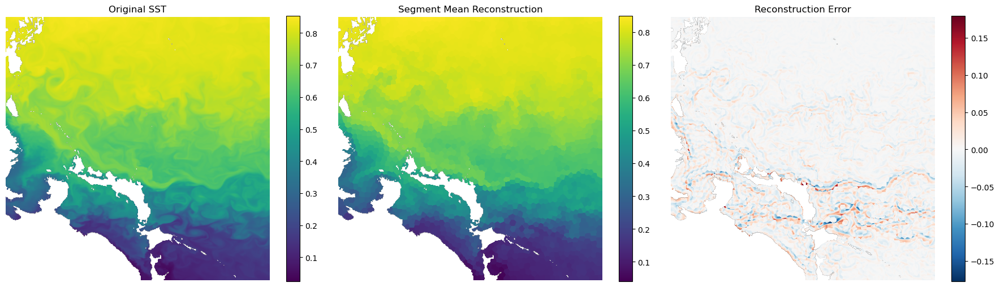

In [65]:
def reconstruct_from_segments(ref_img, segments, mask_ocean):
    node_means = []
    num_nodes = segments.max() + 1

    for n in range(num_nodes):
        vals = ref_img[segments == n]
        node_means.append(np.mean(vals))

    node_means = np.array(node_means, dtype=np.float32)
    rec_img = node_to_pixel(node_means, segments, mask_ocean)
    return rec_img


ref_img = sst_scaled[0]
rec_img = reconstruct_from_segments(ref_img, segments, mask_ocean)

err_img = rec_img - ref_img
ref_ma = np.ma.masked_where(~mask_ocean, ref_img)
rec_ma = np.ma.masked_where(~mask_ocean, rec_img)
err_ma = np.ma.masked_where(~mask_ocean, err_img)

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(ref_ma)
plt.title("Original SST")
plt.colorbar()
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(rec_ma)
plt.title("Segment Mean Reconstruction")
plt.colorbar()
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(err_ma, cmap="RdBu_r")
plt.title("Reconstruction Error")
plt.colorbar()
plt.axis("off")

plt.tight_layout()
plt.show()

In [66]:
def calc_segmentation_lower_bound_rmse(sst_scaled, segments, mask_ocean, vmin_raw, vmax_raw, num_samples=20):
    rmses = []

    total = min(num_samples, len(sst_scaled))
    for i in range(total):
        ref_img = sst_scaled[i]
        rec_img = reconstruct_from_segments(ref_img, segments, mask_ocean)

        ref_img_raw = inverse_scale(ref_img, vmin_raw, vmax_raw)
        rec_img_raw = inverse_scale(rec_img, vmin_raw, vmax_raw)

        valid = mask_ocean & ~np.isnan(ref_img_raw) & ~np.isnan(rec_img_raw)
        rmse = np.sqrt(np.mean((rec_img_raw[valid] - ref_img_raw[valid]) ** 2))
        rmses.append(rmse)

    print(f"分割重建下限 RMSE（前{total}帧平均）= {np.mean(rmses):.6f}")
    return np.mean(rmses), rmses

In [67]:
class SuperpixelGCNTransformer(nn.Module):
    def __init__(self, hidden_dim=128, num_layers=2, nhead=4, dropout=0.1):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.input_proj = nn.Linear(3, hidden_dim)
        self.gcn1 = GCNConv(hidden_dim, hidden_dim)
        self.gcn2 = GCNConv(hidden_dim, hidden_dim)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=nhead,
            dim_feedforward=hidden_dim * 4,
            dropout=dropout,
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        self.out = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x, edge_index):
        B, S, N, _ = x.shape
        x = self.input_proj(x)
        spatial_out = []
        for t in range(S):
            xt = x[:, t, :, :]
            batch_out = []
            for b in range(B):
                h = self.gcn1(xt[b], edge_index)
                h = F.relu(h)
                h = self.gcn2(h, edge_index)
                h = F.relu(h)
                batch_out.append(h)
            batch_out = torch.stack(batch_out, dim=0)
            spatial_out.append(batch_out)

        spatial_out = torch.stack(spatial_out, dim=1) 
        temporal_in = spatial_out.permute(0, 2, 1, 3).reshape(B * N, S, self.hidden_dim)
        temporal_out = self.transformer(temporal_in)
        last_feat = temporal_out[:, -1, :]

        pred = self.out(last_feat).reshape(B, N)
        return pred
model = SuperpixelGCNTransformer()

In [68]:
WINDOW_SIZE = 5

X, y_delta, y_abs = [], [], []

for i in range(len(features_array) - WINDOW_SIZE):
    feat_seq = features_array[i:i + WINDOW_SIZE]

    last_sst = features_array[i + WINDOW_SIZE - 1, :, 0]
    next_sst = features_array[i + WINDOW_SIZE, :, 0]

    target_delta = next_sst - last_sst
    target_abs = next_sst

    X.append(feat_seq)
    y_delta.append(target_delta)
    y_abs.append(target_abs)

X = np.array(X, dtype=np.float32)
y_delta = np.array(y_delta, dtype=np.float32)
y_abs = np.array(y_abs, dtype=np.float32)

split = int(0.8 * len(X))
train_x, test_x = X[:split], X[split:]
train_y, test_y = y_delta[:split], y_delta[split:]
train_y_abs, test_y_abs = y_abs[:split], y_abs[split:]

print("总样本数:", len(X))
print("训练样本数:", len(train_x))
print("测试样本数:", len(test_x))
print("WINDOW_SIZE:", WINDOW_SIZE)

train_feat = torch.tensor(train_x, dtype=torch.float32)
test_feat = torch.tensor(test_x, dtype=torch.float32)

train_y = torch.tensor(train_y, dtype=torch.float32)      
test_y = torch.tensor(test_y, dtype=torch.float32)        

train_y_abs = torch.tensor(train_y_abs, dtype=torch.float32)
test_y_abs = torch.tensor(test_y_abs, dtype=torch.float32)

edge_index = edge_index.long()
print(train_feat.shape, test_feat.shape)

总样本数: 12040
训练样本数: 9632
测试样本数: 2408
WINDOW_SIZE: 5
torch.Size([9632, 5, 2491, 3]) torch.Size([2408, 5, 2491, 3])


In [106]:


from collections import defaultdict
from matplotlib.colors import ListedColormap

from skimage.segmentation import slic, find_boundaries
from skimage.filters import sobel
from scipy.ndimage import gaussian_filter, binary_closing


# =========================
# 0. 基础工具
# =========================
def normalize_01(x):
    x = x.astype(np.float32)
    xmin, xmax = np.nanmin(x), np.nanmax(x)
    return (x - xmin) / (xmax - xmin + 1e-8)


def make_random_cmap(n, seed=42):
    rng = np.random.default_rng(seed)
    colors = rng.random((n, 3))
    if n > 0:
        colors[0] = [0.85, 0.85, 0.85]
    return ListedColormap(colors)


# =========================
# 1. 初始超像素分割
# =========================
def build_masked_slic_segments(
    ref_img,
    mask_ocean,
    n_segments=4200,
    compactness=0.10,
    sigma=1.0,
    smooth_sigma=1.0
):
    """
    说明：
    1) 这里用的是 slic_zero=True，相当于 SLICO 风格
    2) 不再使用 xx, yy 坐标，避免切出经纬条带
    3) 加入局地温度异常 temp_anom，削弱大尺度南北温度背景
    """
    H, W = ref_img.shape

    img = ref_img.astype(np.float32).copy()

    sea_vals = img[mask_ocean]
    fill_value = np.mean(sea_vals[~np.isnan(sea_vals)]) if np.any(mask_ocean) else 0.0
    img[~mask_ocean] = fill_value

    # 轻微平滑
    img_smooth = gaussian_filter(img, sigma=smooth_sigma)

    # 大尺度背景
    img_bg = gaussian_filter(img, sigma=12)

    # 局地异常
    temp_anom = img_smooth - img_bg

    # 梯度
    grad = sobel(img_smooth)

    # 关键：不用坐标，只用温度、局地异常、梯度
    slic_input = np.stack([
        0.6 * normalize_01(img_smooth),
        2.0 * normalize_01(np.abs(temp_anom)),
        3.0 * normalize_01(grad)
    ], axis=-1)

    seg = slic(
        slic_input,
        n_segments=n_segments,
        compactness=compactness,
        sigma=sigma,
        start_label=0,
        channel_axis=-1,
        convert2lab=False,
        enforce_connectivity=True,
        slic_zero=True,
        mask=mask_ocean
    )

    seg = seg.astype(np.int32)
    seg[~mask_ocean] = -1

    # 重新编号，保证从 0 开始连续
    valid_ids = np.unique(seg[seg >= 0])
    remap = {old: new for new, old in enumerate(valid_ids)}

    segments_full = np.full_like(seg, -1, dtype=np.int32)
    for old, new in remap.items():
        segments_full[seg == old] = new

    return segments_full


# =========================
# 2. 图邻接
# =========================
def build_graph_from_segments(segments):
    H, W = segments.shape
    edges = set()

    # 左右相邻
    for y in range(H):
        for x in range(W - 1):
            a, b = segments[y, x], segments[y, x + 1]
            if a >= 0 and b >= 0 and a != b:
                edges.add((a, b))
                edges.add((b, a))

    # 上下相邻
    for y in range(H - 1):
        for x in range(W):
            a, b = segments[y, x], segments[y + 1, x]
            if a >= 0 and b >= 0 and a != b:
                edges.add((a, b))
                edges.add((b, a))

    edge_index = np.array(list(edges), dtype=np.int64).T
    return edge_index


def edge_index_to_pairs(edge_index):
    if hasattr(edge_index, "cpu"):
        arr = edge_index.cpu().numpy()
    else:
        arr = np.asarray(edge_index)

    pairs = set()
    for a, b in zip(arr[0], arr[1]):
        a, b = int(a), int(b)
        if a < 0 or b < 0 or a == b:
            continue
        if a > b:
            a, b = b, a
        pairs.add((a, b))
    return sorted(list(pairs))


# =========================
# 3. 区域统计
# =========================
def compute_region_stats(sst_img, segments):
    num_regions = segments.max() + 1

    region_mean = np.full(num_regions, np.nan, dtype=np.float32)
    region_std = np.full(num_regions, np.nan, dtype=np.float32)
    region_area = np.zeros(num_regions, dtype=np.int32)

    for rid in range(num_regions):
        vals = sst_img[segments == rid]
        if len(vals) == 0:
            continue
        region_mean[rid] = np.mean(vals)
        region_std[rid] = np.std(vals)
        region_area[rid] = len(vals)

    return region_mean, region_std, region_area


def build_boundary_stats(segments, sst_img):
    """
    统计相邻区域之间：
    1) 共享边界长度
    2) 共享边界上的平均梯度强度
    """
    grad = sobel(sst_img.astype(np.float32))

    stats = defaultdict(lambda: {"length": 0, "grad_sum": 0.0})

    # 左右相邻
    a = segments[:, :-1]
    b = segments[:, 1:]
    g = 0.5 * (grad[:, :-1] + grad[:, 1:])
    mask = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(mask)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        stats[(i, j)]["length"] += 1
        stats[(i, j)]["grad_sum"] += float(g[y, x])

    # 上下相邻
    a = segments[:-1, :]
    b = segments[1:, :]
    g = 0.5 * (grad[:-1, :] + grad[1:, :])
    mask = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(mask)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        stats[(i, j)]["length"] += 1
        stats[(i, j)]["grad_sum"] += float(g[y, x])

    boundary_len = {}
    boundary_grad = {}
    for k, v in stats.items():
        boundary_len[k] = v["length"]
        boundary_grad[k] = v["grad_sum"] / max(v["length"], 1)

    return boundary_len, boundary_grad


# =========================
# 4. 并查集
# =========================
class UnionFind:
    def __init__(self, n):
        self.parent = np.arange(n)
        self.rank = np.zeros(n, dtype=np.int32)

    def find(self, x):
        while self.parent[x] != x:
            self.parent[x] = self.parent[self.parent[x]]
            x = self.parent[x]
        return x

    def union(self, a, b):
        ra, rb = self.find(a), self.find(b)
        if ra == rb:
            return
        if self.rank[ra] < self.rank[rb]:
            self.parent[ra] = rb
        elif self.rank[ra] > self.rank[rb]:
            self.parent[rb] = ra
        else:
            self.parent[rb] = ra
            self.rank[ra] += 1


# =========================
# 5. 小区域合并
# =========================
def merge_small_regions_only(
    segments,
    region_mean,
    region_std,
    region_area,
    boundary_len,
    boundary_grad,
    area_min=80
):
    """
    这里只做：
    小区域优先合并
    不再做第二阶段“全局继续合并”，
    避免最后又合成长条纬向带。
    """
    n = len(region_mean)
    uf = UnionFind(n)

    neighbors = defaultdict(set)
    for (a, b) in boundary_len.keys():
        neighbors[a].add(b)
        neighbors[b].add(a)

    order = np.argsort(region_area)

    for rid in order:
        if region_area[rid] == 0:
            continue
        if region_area[rid] >= area_min:
            continue
        if rid not in neighbors or len(neighbors[rid]) == 0:
            continue

        best_nb = None
        best_score = np.inf

        for nb in neighbors[rid]:
            a, b = min(rid, nb), max(rid, nb)

            mean_diff = abs(region_mean[rid] - region_mean[nb])
            bg = boundary_grad.get((a, b), 999.0)

            # 小区域优先并给：温差小 + 边界弱的邻居
            score = mean_diff + 0.5 * bg
            if score < best_score:
                best_score = score
                best_nb = nb

        if best_nb is not None:
            uf.union(rid, best_nb)

    # 重编号
    root_to_new = {}
    mapping = {}
    new_id = 0
    for rid in range(n):
        root = uf.find(rid)
        if root not in root_to_new:
            root_to_new[root] = new_id
            new_id += 1
        mapping[rid] = root_to_new[root]

    wm_segments = np.full_like(segments, -1, dtype=np.int32)
    for old_id, new_id in mapping.items():
        wm_segments[segments == old_id] = new_id

    return wm_segments


# =========================
# 6. 最终水团属性
# =========================
def compute_watermass_mean(sst_img, wm_segments):
    num_wm = wm_segments.max() + 1

    wm_mean = np.full(num_wm, np.nan, dtype=np.float32)
    wm_area = np.zeros(num_wm, dtype=np.int32)

    for wid in range(num_wm):
        vals = sst_img[wm_segments == wid]
        if len(vals) == 0:
            continue
        wm_mean[wid] = np.mean(vals)
        wm_area[wid] = len(vals)

    return wm_mean, wm_area


# =========================
# 7. 提取锋面候选
# =========================
def extract_front_mask(
    wm_segments,
    wm_mean,
    wm_area,
    boundary_len_min=6,
    front_temp_diff_thr=0.10
):
    """
    这里不是提“最强锋面”，而是先提“锋面候选”：
    1) 两边是不同水团
    2) 两边均值温差达到阈值
    3) 共享边界长度不能太短
    """
    H, W = wm_segments.shape
    front_mask = np.zeros((H, W), dtype=bool)

    # 左右方向
    a = wm_segments[:, :-1]
    b = wm_segments[:, 1:]
    valid = (a >= 0) & (b >= 0) & (a != b)

    pair_len = defaultdict(int)
    ys, xs = np.where(valid)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        pair_len[(i, j)] += 1

    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i

        if (pair_len[(i, j)] >= boundary_len_min) and (abs(wm_mean[i] - wm_mean[j]) >= front_temp_diff_thr):
            front_mask[y, x] = True
            front_mask[y, x + 1] = True

    # 上下方向
    a = wm_segments[:-1, :]
    b = wm_segments[1:, :]
    valid = (a >= 0) & (b >= 0) & (a != b)

    pair_len = defaultdict(int)
    ys, xs = np.where(valid)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        pair_len[(i, j)] += 1

    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i

        if (pair_len[(i, j)] >= boundary_len_min) and (abs(wm_mean[i] - wm_mean[j]) >= front_temp_diff_thr):
            front_mask[y, x] = True
            front_mask[y + 1, x] = True

    # 只做 closing，让锋面稍微连一点；不做 opening，避免把细锋面删掉
    front_mask = binary_closing(front_mask, structure=np.ones((2, 2)))

    return front_mask


# =========================
# 8. 绘图
# =========================
def plot_watermass_front_result_final(
    sst_img,
    mask_ocean,
    segments_init,
    wm_segments,
    front_mask,
    title_prefix=""
):
    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)

    init_bound = find_boundaries(segments_init, mode="outer") & mask_ocean
    wm_bound = find_boundaries(wm_segments, mode="outer") & mask_ocean
    wm_show = np.ma.masked_where(wm_segments < 0, wm_segments)

    fig, axes = plt.subplots(1, 4, figsize=(22, 5), constrained_layout=True)

    # 1. 原始 SST
    im0 = axes[0].imshow(sst_ma, cmap="turbo", origin="lower")
    axes[0].set_title(f"{title_prefix} SST")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    # 2. 初始超像素
    axes[1].imshow(sst_ma, cmap="gray", origin="lower")
    axes[1].contour(init_bound.astype(int), levels=[0.5], colors="cyan", linewidths=0.2)
    axes[1].set_title(f"{title_prefix} Initial superpixels")
    axes[1].axis("off")

    # 3. 最终水团，用随机色，不再用 tab20
    n_wm = int(wm_segments.max() + 1)
    rand_cmap = make_random_cmap(n_wm + 1, seed=42)

    im2 = axes[2].imshow(wm_show, cmap=rand_cmap, origin="lower")
    axes[2].contour(wm_bound.astype(int), levels=[0.5], colors="black", linewidths=0.2)
    axes[2].set_title(f"{title_prefix} Watermasses")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    # 4. 锋面候选
    axes[3].imshow(sst_ma, cmap="gray", origin="lower")
    axes[3].contour(front_mask.astype(int), levels=[0.5], colors="red", linewidths=0.8)
    axes[3].set_title(f"{title_prefix} Front candidates")
    axes[3].axis("off")

    plt.show()

sst_raw shape: (481, 481)
初始超像素数量: 4185
最终水团数量: 1142
锋面像素数: 44122


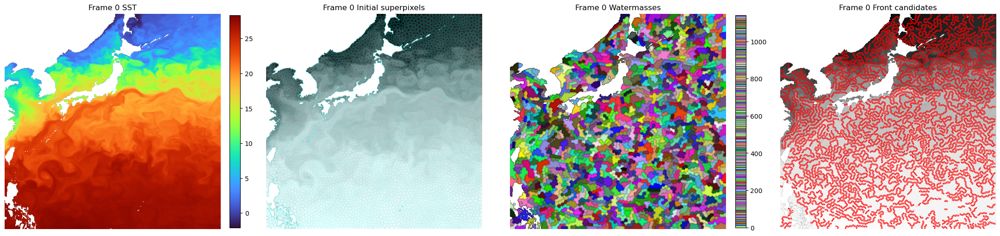

In [107]:
# =========================
# 单帧测试
# =========================

idx = 0
sst_raw = inverse_scale(sst_scaled[idx], data_min, data_max)

# 1) 初始超像素
segments_front = build_masked_slic_segments(
    ref_img=sst_raw,
    mask_ocean=mask_ocean,
    n_segments=4200,
    compactness=0.10,
    sigma=1.0,
    smooth_sigma=1.0
)

edge_index_front = build_graph_from_segments(segments_front)

print("sst_raw shape:", sst_raw.shape)
print("初始超像素数量:", segments_front.max() + 1)

# 2) 初始小区域统计
region_mean, region_std, region_area = compute_region_stats(sst_raw, segments_front)

# 3) 边界统计
boundary_len, boundary_grad = build_boundary_stats(segments_front, sst_raw)

# 4) 只做小区域合并
wm_segments = merge_small_regions_only(
    segments=segments_front,
    region_mean=region_mean,
    region_std=region_std,
    region_area=region_area,
    boundary_len=boundary_len,
    boundary_grad=boundary_grad,
    area_min=80
)

# 5) 最终水团均值
wm_mean, wm_area = compute_watermass_mean(sst_raw, wm_segments)

# 6) 锋面候选提取
front_mask = extract_front_mask(
    wm_segments=wm_segments,
    wm_mean=wm_mean,
    wm_area=wm_area,
    boundary_len_min=6,
    front_temp_diff_thr=0.10
)

print("最终水团数量:", wm_segments.max() + 1)
print("锋面像素数:", int(front_mask.sum()))

# 7) 画图
plot_watermass_front_result_final(
    sst_img=sst_raw,
    mask_ocean=mask_ocean,
    segments_init=segments_front,
    wm_segments=wm_segments,
    front_mask=front_mask,
    title_prefix=f"Frame {idx}"
)

In [109]:


from collections import defaultdict
from matplotlib.colors import ListedColormap

from scipy.ndimage import (
    gaussian_filter,
    distance_transform_edt,
    binary_closing,
    binary_opening
)

from skimage.filters import sobel
from skimage.segmentation import watershed, find_boundaries
from skimage.feature import peak_local_max
from skimage.measure import label
from skimage.morphology import remove_small_objects


# =========================
# 0. 基础工具
# =========================
def normalize_01(x, mask=None):
    x = x.astype(np.float32)
    if mask is None:
        xmin, xmax = np.nanmin(x), np.nanmax(x)
    else:
        vals = x[mask]
        xmin, xmax = np.nanmin(vals), np.nanmax(vals)
    return (x - xmin) / (xmax - xmin + 1e-8)


def make_random_cmap(n, seed=42):
    rng = np.random.default_rng(seed)
    colors = rng.random((n, 3))
    if n > 0:
        colors[0] = [0.85, 0.85, 0.85]
    return ListedColormap(colors)


# =========================
# 1. 多尺度 barrier/front 强度图
# =========================
def build_multiscale_barrier_map(
    sst_img,
    mask_ocean,
    sigmas=(1.0, 2.0, 4.0),
    weights=(0.5, 0.3, 0.2),
    bg_sigma=10.0,
    anom_w=0.35
):
    """
    说明：
    barrier 越大，越像边界，watershed 越不容易跨过去
    这里用：
    1) 多尺度梯度
    2) 局地异常
    一起构成 barrier
    """
    img = sst_img.astype(np.float32).copy()
    sea_vals = img[mask_ocean]
    fill_value = np.mean(sea_vals[~np.isnan(sea_vals)]) if np.any(mask_ocean) else 0.0
    img[~mask_ocean] = fill_value

    # 多尺度梯度
    grad_sum = np.zeros_like(img, dtype=np.float32)
    for s, w in zip(sigmas, weights):
        sm = gaussian_filter(img, sigma=s)
        g = sobel(sm)
        grad_sum += w * normalize_01(g, mask_ocean)

    # 局地异常（削弱大尺度南北背景）
    img_s1 = gaussian_filter(img, sigma=1.0)
    img_bg = gaussian_filter(img, sigma=bg_sigma)
    anom = np.abs(img_s1 - img_bg)
    anom_n = normalize_01(anom, mask_ocean)

    barrier = grad_sum + anom_w * anom_n
    barrier = normalize_01(barrier, mask_ocean)

    return barrier


# =========================
# 2. 用低 barrier 区找 markers
# =========================
def build_watershed_markers(
    barrier,
    mask_ocean,
    core_quantile=0.35,
    min_core_size=40,
    peak_min_distance=8
):
    """
    思路：
    barrier 低的地方更像水团内部
    先找这些均一区，再从里面找种子点
    """
    ocean_vals = barrier[mask_ocean]
    thr = np.quantile(ocean_vals, core_quantile)

    # 低 barrier 核心区
    core = (barrier <= thr) & mask_ocean

    # 清理太小的核心块
    core = remove_small_objects(core, min_size=min_core_size)

    # 距离变换：核心区内部越深处越适合做种子
    dist = distance_transform_edt(core)

    # 在距离图上找局部峰值作为 markers
    coords = peak_local_max(
        dist,
        min_distance=peak_min_distance,
        labels=core,
        exclude_border=False
    )

    markers = np.zeros_like(barrier, dtype=np.int32)
    for i, (r, c) in enumerate(coords, start=1):
        markers[r, c] = i

    # 如果峰值太少，退化成对 core 连通区域做 label
    if markers.max() == 0:
        markers = label(core).astype(np.int32)
    else:
        markers = watershed(
            -dist,
            markers=markers,
            mask=core
        ).astype(np.int32)

    return markers, core, thr


# =========================
# 3. watershed 分割
# =========================
def run_watershed_watermass_segmentation(
    sst_img,
    mask_ocean,
    sigmas=(1.0, 2.0, 4.0),
    weights=(0.5, 0.3, 0.2),
    bg_sigma=10.0,
    anom_w=0.35,
    core_quantile=0.35,
    min_core_size=40,
    peak_min_distance=8,
    compactness=0.0
):
    barrier = build_multiscale_barrier_map(
        sst_img=sst_img,
        mask_ocean=mask_ocean,
        sigmas=sigmas,
        weights=weights,
        bg_sigma=bg_sigma,
        anom_w=anom_w
    )

    markers, core, thr = build_watershed_markers(
        barrier=barrier,
        mask_ocean=mask_ocean,
        core_quantile=core_quantile,
        min_core_size=min_core_size,
        peak_min_distance=peak_min_distance
    )

    # watershed 正式分割
    wm_segments = watershed(
        barrier,
        markers=markers,
        mask=mask_ocean,
        compactness=compactness,
        watershed_line=False
    ).astype(np.int32)

    # 重新编号，从 0 开始连续
    wm_segments[~mask_ocean] = -1
    valid_ids = np.unique(wm_segments[wm_segments >= 0])
    remap = {old: new for new, old in enumerate(valid_ids)}

    wm_out = np.full_like(wm_segments, -1, dtype=np.int32)
    for old, new in remap.items():
        wm_out[wm_segments == old] = new

    result = {
        "barrier": barrier,
        "markers": markers,
        "core": core,
        "core_thr": thr,
        "wm_segments": wm_out
    }
    return result


# =========================
# 4. 区域统计
# =========================
def compute_region_mean_area(sst_img, segments):
    n = int(segments.max() + 1)
    region_mean = np.full(n, np.nan, dtype=np.float32)
    region_area = np.zeros(n, dtype=np.int32)

    for rid in range(n):
        vals = sst_img[segments == rid]
        if len(vals) == 0:
            continue
        region_mean[rid] = np.mean(vals)
        region_area[rid] = len(vals)

    return region_mean, region_area


# =========================
# 5. 区域边界统计
# =========================
def build_region_boundary_stats(segments, barrier):
    """
    对每对相邻区域，统计：
    1) 共享边界长度
    2) 边界上的平均 barrier 强度
    """
    stats = defaultdict(lambda: {"length": 0, "barrier_sum": 0.0})

    # 左右
    a = segments[:, :-1]
    b = segments[:, 1:]
    v = 0.5 * (barrier[:, :-1] + barrier[:, 1:])
    mask = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(mask)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        stats[(i, j)]["length"] += 1
        stats[(i, j)]["barrier_sum"] += float(v[y, x])

    # 上下
    a = segments[:-1, :]
    b = segments[1:, :]
    v = 0.5 * (barrier[:-1, :] + barrier[1:, :])
    mask = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(mask)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i
        stats[(i, j)]["length"] += 1
        stats[(i, j)]["barrier_sum"] += float(v[y, x])

    boundary_len = {}
    boundary_barrier = {}
    for k, vv in stats.items():
        boundary_len[k] = vv["length"]
        boundary_barrier[k] = vv["barrier_sum"] / max(vv["length"], 1)

    return boundary_len, boundary_barrier


# =========================
# 6. 从区域边界中提锋面
# =========================
def extract_front_from_watershed_regions(
    wm_segments,
    region_mean,
    region_area,
    boundary_len,
    boundary_barrier,
    boundary_len_min=10,
    temp_diff_thr=0.25,
    barrier_thr=0.35,
    min_region_area=60
):
    """
    只保留：
    1) 两侧区域面积不能太小
    2) 边界长度够长
    3) 两侧温差够大
    4) 边界上的 barrier 够强
    """
    H, W = wm_segments.shape
    front_mask = np.zeros((H, W), dtype=bool)

    # 左右方向
    a = wm_segments[:, :-1]
    b = wm_segments[:, 1:]
    valid = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(valid)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i

        if region_area[i] < min_region_area or region_area[j] < min_region_area:
            continue
        if boundary_len.get((i, j), 0) < boundary_len_min:
            continue
        if abs(region_mean[i] - region_mean[j]) < temp_diff_thr:
            continue
        if boundary_barrier.get((i, j), 0.0) < barrier_thr:
            continue

        front_mask[y, x] = True
        front_mask[y, x + 1] = True

    # 上下方向
    a = wm_segments[:-1, :]
    b = wm_segments[1:, :]
    valid = (a >= 0) & (b >= 0) & (a != b)

    ys, xs = np.where(valid)
    for y, x in zip(ys, xs):
        i, j = int(a[y, x]), int(b[y, x])
        if i > j:
            i, j = j, i

        if region_area[i] < min_region_area or region_area[j] < min_region_area:
            continue
        if boundary_len.get((i, j), 0) < boundary_len_min:
            continue
        if abs(region_mean[i] - region_mean[j]) < temp_diff_thr:
            continue
        if boundary_barrier.get((i, j), 0.0) < barrier_thr:
            continue

        front_mask[y, x] = True
        front_mask[y + 1, x] = True

    # 轻微连贯化
    front_mask = binary_closing(front_mask, structure=np.ones((2, 2)))

    return front_mask


# =========================
# 7. 绘图
# =========================
def plot_watershed_result(
    sst_img,
    barrier,
    markers,
    wm_segments,
    front_mask,
    mask_ocean,
    title_prefix=""
):
    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)
    barrier_ma = np.ma.masked_where(~mask_ocean, barrier)
    wm_ma = np.ma.masked_where(wm_segments < 0, wm_segments)

    n_wm = int(wm_segments.max() + 1)
    rand_cmap = make_random_cmap(n_wm + 1, seed=42)

    wm_bound = find_boundaries(wm_segments, mode="outer") & mask_ocean

    fig, axes = plt.subplots(1, 5, figsize=(26, 5), constrained_layout=True)

    im0 = axes[0].imshow(sst_ma, cmap="turbo", origin="lower", interpolation="nearest")
    axes[0].set_title(f"{title_prefix} SST")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(barrier_ma, cmap="magma", origin="lower", interpolation="nearest")
    axes[1].set_title(f"{title_prefix} Barrier map")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].imshow(sst_ma, cmap="gray", origin="lower", interpolation="nearest")
    axes[2].contour(markers > 0, levels=[0.5], colors="lime", linewidths=0.5)
    axes[2].set_title(f"{title_prefix} Markers")
    axes[2].axis("off")

    im3 = axes[3].imshow(wm_ma, cmap=rand_cmap, origin="lower", interpolation="nearest")
    axes[3].contour(wm_bound.astype(int), levels=[0.5], colors="black", linewidths=0.2)
    axes[3].set_title(f"{title_prefix} Watermasses")
    axes[3].axis("off")
    plt.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

    axes[4].imshow(sst_ma, cmap="gray", origin="lower", interpolation="nearest")
    axes[4].contour(front_mask.astype(int), levels=[0.5], colors="red", linewidths=0.8)
    axes[4].set_title(f"{title_prefix} Front from regions")
    axes[4].axis("off")

    plt.show()

watershed 区域数量: 854
marker 数量: 854
锋面像素数: 6419
海域内未分配像素数: 0


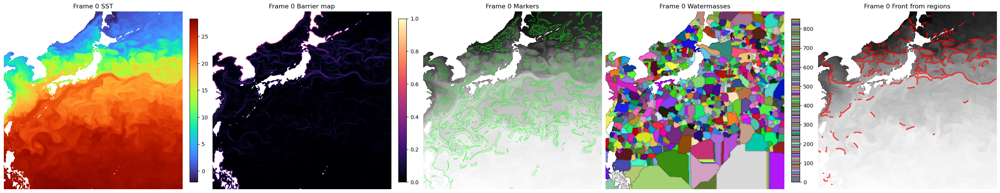

In [112]:
# ======================================
# 单帧测试：watershed 水团-锋面识别
# 你前面应当已经有：
# sst_scaled, data_min, data_max, mask_ocean, inverse_scale
# ======================================

idx = 0
sst_raw = inverse_scale(sst_scaled[idx], data_min, data_max)

ws_result = run_watershed_watermass_segmentation(
    sst_img=sst_raw,
    mask_ocean=mask_ocean,
    sigmas=(0.8, 1.5, 2.5),
    weights=(0.7, 0.2, 0.1),
    bg_sigma=6.0,
    anom_w=0.10,
    core_quantile=0.62,
    min_core_size=8,
    peak_min_distance=3,
    compactness=0.0
)

wm_segments = ws_result["wm_segments"]
barrier = ws_result["barrier"]
markers = ws_result["markers"]

region_mean, region_area = compute_region_mean_area(sst_raw, wm_segments)
boundary_len, boundary_barrier = build_region_boundary_stats(wm_segments, barrier)

front_mask = extract_front_from_watershed_regions(
    wm_segments=wm_segments,
    region_mean=region_mean,
    region_area=region_area,
    boundary_len=boundary_len,
    boundary_barrier=boundary_barrier,
    boundary_len_min=3,
    temp_diff_thr=0.05,
    barrier_thr=0.08,
    min_region_area=8
)

print("watershed 区域数量:", wm_segments.max() + 1)
print("marker 数量:", markers.max())
print("锋面像素数:", int(front_mask.sum()))
print("海域内未分配像素数:", np.sum((wm_segments < 0) & mask_ocean))

plot_watershed_result(
    sst_img=sst_raw,
    barrier=barrier,
    markers=markers,
    wm_segments=wm_segments,
    front_mask=front_mask,
    mask_ocean=mask_ocean,
    title_prefix=f"Frame {idx}"
)

In [115]:


from scipy.ndimage import gaussian_filter, binary_closing, binary_opening
from skimage.filters import sobel
from skimage.segmentation import watershed, find_boundaries
from skimage.feature import peak_local_max
from skimage.measure import label
from skimage.morphology import remove_small_objects


# =====================================================
# 1. 基础归一化
# =====================================================
def normalize_01(x, mask=None):
    x = x.astype(np.float32).copy()
    if mask is None:
        vals = x[np.isfinite(x)]
    else:
        vals = x[mask & np.isfinite(x)]
    if len(vals) == 0:
        return np.zeros_like(x, dtype=np.float32)

    xmin = np.nanmin(vals)
    xmax = np.nanmax(vals)
    return (x - xmin) / (xmax - xmin + 1e-8)


# =====================================================
# 2. 构造锋面势垒图 barrier
# =====================================================
def build_front_barrier(
    sst_img,
    mask_ocean,
    smooth_sigma=1.0,
    grad_power=1.5,
    use_anom=True,
    bg_sigma=12.0,
    anom_weight=0.25
):
    """
    barrier 越大，越像锋面，watershed 越不容易跨过去。
    """
    img = sst_img.astype(np.float32).copy()

    sea_vals = img[mask_ocean & np.isfinite(img)]
    fill_value = np.nanmean(sea_vals)
    img[~mask_ocean] = fill_value
    img[~np.isfinite(img)] = fill_value

    # 平滑后求梯度
    img_smooth = gaussian_filter(img, sigma=smooth_sigma)
    grad = sobel(img_smooth)
    grad_n = normalize_01(grad, mask_ocean)

    # 强化锋面
    barrier = grad_n ** grad_power

    # 加局地异常，避免只看单纯梯度
    if use_anom:
        bg = gaussian_filter(img, sigma=bg_sigma)
        anom = np.abs(img_smooth - bg)
        anom_n = normalize_01(anom, mask_ocean)
        barrier = barrier + anom_weight * anom_n

    barrier = normalize_01(barrier, mask_ocean)

    # 陆地设成高势垒
    barrier[~mask_ocean] = 1.0

    return barrier, grad_n


# =====================================================
# 3. 生成 markers
# =====================================================
def build_markers_from_barrier(
    barrier,
    mask_ocean,
    low_barrier_quantile=0.45,
    min_core_size=20,
    marker_min_distance=5
):
    """
    只在低 barrier 区，也就是相对均匀的水团内部生成种子。
    """
    ocean_vals = barrier[mask_ocean]
    thr = np.quantile(ocean_vals, low_barrier_quantile)

    core = (barrier <= thr) & mask_ocean
    core = remove_small_objects(core, min_size=min_core_size)

    # 用 -barrier 找低势垒中心点
    coords = peak_local_max(
        -barrier,
        min_distance=marker_min_distance,
        labels=core,
        exclude_border=False
    )

    markers = np.zeros_like(barrier, dtype=np.int32)

    for i, (r, c) in enumerate(coords, start=1):
        markers[r, c] = i

    # 如果点太少，就退化成连通域 marker
    if markers.max() < 5:
        markers = label(core).astype(np.int32)

    return markers, core, thr


# =====================================================
# 4. watershed 水团分割
# =====================================================
def run_watershed_once(
    sst_img,
    mask_ocean,
    smooth_sigma=1.0,
    grad_power=1.5,
    low_barrier_quantile=0.45,
    min_core_size=20,
    marker_min_distance=5,
    bg_sigma=12.0,
    anom_weight=0.25,
    compactness=0.0
):
    barrier, grad_n = build_front_barrier(
        sst_img=sst_img,
        mask_ocean=mask_ocean,
        smooth_sigma=smooth_sigma,
        grad_power=grad_power,
        use_anom=True,
        bg_sigma=bg_sigma,
        anom_weight=anom_weight
    )

    markers, core, core_thr = build_markers_from_barrier(
        barrier=barrier,
        mask_ocean=mask_ocean,
        low_barrier_quantile=low_barrier_quantile,
        min_core_size=min_core_size,
        marker_min_distance=marker_min_distance
    )

    labels_ws = watershed(
        barrier,
        markers=markers,
        mask=mask_ocean,
        compactness=compactness,
        watershed_line=False
    ).astype(np.int32)

    labels_ws[~mask_ocean] = -1

    # 重新编号
    valid_ids = np.unique(labels_ws[labels_ws >= 0])
    new_labels = np.full_like(labels_ws, -1, dtype=np.int32)

    for new_id, old_id in enumerate(valid_ids):
        new_labels[labels_ws == old_id] = new_id

    return {
        "labels": new_labels,
        "barrier": barrier,
        "grad": grad_n,
        "markers": markers,
        "core": core,
        "core_thr": core_thr
    }


# =====================================================
# 5. 从区域边界提锋面
# =====================================================
def extract_front_by_region_boundary(
    labels_ws,
    grad_n,
    mask_ocean,
    grad_thr=0.15,
    min_component_size=15
):
    """
    从区域边界中提锋面。
    注意：不是所有水团边界都是锋面，还要满足梯度强。
    """
    boundary = find_boundaries(labels_ws, mode="outer") & mask_ocean

    front = boundary & (grad_n >= grad_thr)

    # 去小碎线
    front = remove_small_objects(front, min_size=min_component_size)

    # 轻微连通
    front = binary_closing(front, structure=np.ones((2, 2)))

    return front, boundary


# =====================================================
# 6. 单组参数完整运行
# =====================================================
def run_one_param_set(
    sst_img,
    mask_ocean,
    params
):
    result = run_watershed_once(
        sst_img=sst_img,
        mask_ocean=mask_ocean,
        smooth_sigma=params["smooth_sigma"],
        grad_power=params["grad_power"],
        low_barrier_quantile=params["low_barrier_quantile"],
        min_core_size=params["min_core_size"],
        marker_min_distance=params["marker_min_distance"],
        bg_sigma=params["bg_sigma"],
        anom_weight=params["anom_weight"],
        compactness=params["compactness"]
    )

    front, boundary = extract_front_by_region_boundary(
        labels_ws=result["labels"],
        grad_n=result["grad"],
        mask_ocean=mask_ocean,
        grad_thr=params["grad_thr"],
        min_component_size=params["min_component_size"]
    )

    labels_ws = result["labels"]

    n_region = int(labels_ws.max() + 1)
    n_marker = int(result["markers"].max())
    n_front = int(front.sum())
    n_boundary = int(boundary.sum())
    n_gap = int(np.sum((labels_ws < 0) & mask_ocean))

    out = {
        **result,
        "front": front,
        "boundary": boundary,
        "n_region": n_region,
        "n_marker": n_marker,
        "n_front": n_front,
        "n_boundary": n_boundary,
        "n_gap": n_gap,
        "params": params
    }

    return out


# =====================================================
# 7. 画单组结果
# =====================================================
def plot_one_result(
    sst_img,
    mask_ocean,
    out,
    title="Result"
):
    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)
    barrier_ma = np.ma.masked_where(~mask_ocean, out["barrier"])
    grad_ma = np.ma.masked_where(~mask_ocean, out["grad"])
    labels_ma = np.ma.masked_where(out["labels"] < 0, out["labels"])

    fig, axes = plt.subplots(1, 5, figsize=(25, 5), constrained_layout=True)

    im0 = axes[0].imshow(sst_ma, cmap="turbo", origin="lower", interpolation="nearest")
    axes[0].set_title("SST")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(grad_ma, cmap="magma", origin="lower", interpolation="nearest")
    axes[1].set_title("Gradient / front strength")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    im2 = axes[2].imshow(barrier_ma, cmap="magma", origin="lower", interpolation="nearest")
    axes[2].set_title("Barrier")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    im3 = axes[3].imshow(labels_ma, cmap="nipy_spectral", origin="lower", interpolation="nearest")
    axes[3].set_title(f"Watermasses: {out['n_region']}")
    axes[3].axis("off")
    plt.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

    axes[4].imshow(sst_ma, cmap="gray", origin="lower", interpolation="nearest")
    axes[4].contour(out["front"].astype(int), levels=[0.5], colors="red", linewidths=0.6)
    axes[4].set_title(f"Front pixels: {out['n_front']}")
    axes[4].axis("off")

    plt.suptitle(
        f"{title} | region={out['n_region']} | marker={out['n_marker']} | "
        f"front={out['n_front']} | gap={out['n_gap']}",
        fontsize=14
    )
    plt.show()


# =====================================================
# 8. 多组参数对比画图
# =====================================================
def plot_param_grid_results(
    sst_img,
    mask_ocean,
    results,
    max_show=6
):
    show_results = results[:max_show]

    fig, axes = plt.subplots(len(show_results), 4, figsize=(22, 4 * len(show_results)), constrained_layout=True)

    if len(show_results) == 1:
        axes = axes[None, :]

    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)

    for row, out in enumerate(show_results):
        labels_ma = np.ma.masked_where(out["labels"] < 0, out["labels"])
        grad_ma = np.ma.masked_where(~mask_ocean, out["grad"])

        axes[row, 0].imshow(sst_ma, cmap="turbo", origin="lower", interpolation="nearest")
        axes[row, 0].set_title("SST")
        axes[row, 0].axis("off")

        axes[row, 1].imshow(grad_ma, cmap="magma", origin="lower", interpolation="nearest")
        axes[row, 1].set_title("Gradient")
        axes[row, 1].axis("off")

        axes[row, 2].imshow(labels_ma, cmap="nipy_spectral", origin="lower", interpolation="nearest")
        axes[row, 2].set_title(f"Watermasses: {out['n_region']}")
        axes[row, 2].axis("off")

        axes[row, 3].imshow(sst_ma, cmap="gray", origin="lower", interpolation="nearest")
        axes[row, 3].contour(out["front"].astype(int), levels=[0.5], colors="red", linewidths=0.5)
        axes[row, 3].set_title(
            f"Front: {out['n_front']} | marker: {out['n_marker']}\n"
            f"q={out['params']['low_barrier_quantile']}, "
            f"dist={out['params']['marker_min_distance']}, "
            f"gthr={out['params']['grad_thr']}"
        )
        axes[row, 3].axis("off")

    plt.show()

正在运行参数组 0
{'smooth_sigma': 1.2, 'grad_power': 1.8, 'low_barrier_quantile': 0.4, 'min_core_size': 30, 'marker_min_distance': 8, 'bg_sigma': 12.0, 'anom_weight': 0.2, 'compactness': 0.0, 'grad_thr': 0.18, 'min_component_size': 20}
参数组 0 完成：regions=332, markers=332, front_pixels=294, boundary_pixels=32590, gap=0
正在运行参数组 1
{'smooth_sigma': 1.0, 'grad_power': 1.6, 'low_barrier_quantile': 0.45, 'min_core_size': 20, 'marker_min_distance': 6, 'bg_sigma': 10.0, 'anom_weight': 0.2, 'compactness': 0.0, 'grad_thr': 0.14, 'min_component_size': 15}
参数组 1 完成：regions=510, markers=510, front_pixels=1039, boundary_pixels=39463, gap=0
正在运行参数组 2
{'smooth_sigma': 0.9, 'grad_power': 1.4, 'low_barrier_quantile': 0.52, 'min_core_size': 12, 'marker_min_distance': 5, 'bg_sigma': 9.0, 'anom_weight': 0.15, 'compactness': 0.0, 'grad_thr': 0.1, 'min_component_size': 10}
参数组 2 完成：regions=640, markers=640, front_pixels=2797, boundary_pixels=45424, gap=0
正在运行参数组 3
{'smooth_sigma': 0.8, 'grad_power': 1.3, 'low_barrier_

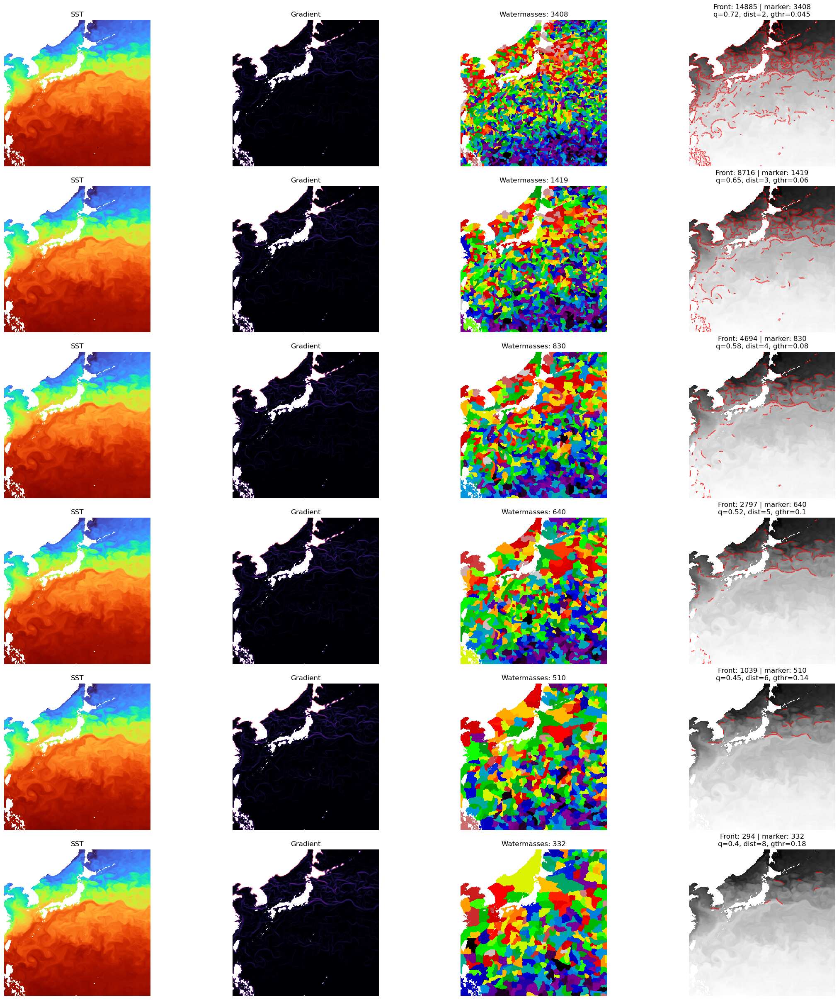

In [116]:
# =====================================================
# 参数组：从粗到细
# =====================================================
param_list = [
    # 0：偏粗，适合看大水团
    {
        "smooth_sigma": 1.2,
        "grad_power": 1.8,
        "low_barrier_quantile": 0.40,
        "min_core_size": 30,
        "marker_min_distance": 8,
        "bg_sigma": 12.0,
        "anom_weight": 0.20,
        "compactness": 0.0,
        "grad_thr": 0.18,
        "min_component_size": 20
    },

    # 1：中等偏粗
    {
        "smooth_sigma": 1.0,
        "grad_power": 1.6,
        "low_barrier_quantile": 0.45,
        "min_core_size": 20,
        "marker_min_distance": 6,
        "bg_sigma": 10.0,
        "anom_weight": 0.20,
        "compactness": 0.0,
        "grad_thr": 0.14,
        "min_component_size": 15
    },

    # 2：中等，建议重点看这一组
    {
        "smooth_sigma": 0.9,
        "grad_power": 1.4,
        "low_barrier_quantile": 0.52,
        "min_core_size": 12,
        "marker_min_distance": 5,
        "bg_sigma": 9.0,
        "anom_weight": 0.15,
        "compactness": 0.0,
        "grad_thr": 0.10,
        "min_component_size": 10
    },

    # 3：中等偏细
    {
        "smooth_sigma": 0.8,
        "grad_power": 1.3,
        "low_barrier_quantile": 0.58,
        "min_core_size": 8,
        "marker_min_distance": 4,
        "bg_sigma": 8.0,
        "anom_weight": 0.12,
        "compactness": 0.0,
        "grad_thr": 0.08,
        "min_component_size": 8
    },

    # 4：偏细，锋面会更多
    {
        "smooth_sigma": 0.7,
        "grad_power": 1.2,
        "low_barrier_quantile": 0.65,
        "min_core_size": 5,
        "marker_min_distance": 3,
        "bg_sigma": 7.0,
        "anom_weight": 0.10,
        "compactness": 0.0,
        "grad_thr": 0.06,
        "min_component_size": 5
    },

    # 5：极细，只用来看看上限，可能会碎
    {
        "smooth_sigma": 0.6,
        "grad_power": 1.1,
        "low_barrier_quantile": 0.72,
        "min_core_size": 3,
        "marker_min_distance": 2,
        "bg_sigma": 6.0,
        "anom_weight": 0.08,
        "compactness": 0.0,
        "grad_thr": 0.045,
        "min_component_size": 3
    },
]


# =====================================================
# 批量运行
# =====================================================
all_results = []

for i, params in enumerate(param_list):
    print("=" * 80)
    print(f"正在运行参数组 {i}")
    print(params)

    out = run_one_param_set(
        sst_img=sst_raw,
        mask_ocean=mask_ocean,
        params=params
    )

    print(
        f"参数组 {i} 完成："
        f"regions={out['n_region']}, "
        f"markers={out['n_marker']}, "
        f"front_pixels={out['n_front']}, "
        f"boundary_pixels={out['n_boundary']}, "
        f"gap={out['n_gap']}"
    )

    all_results.append(out)


# =====================================================
# 按锋面像素数量排序，先看锋面较多的
# =====================================================
all_results_sorted = sorted(all_results, key=lambda x: x["n_front"], reverse=True)

plot_param_grid_results(
    sst_img=sst_raw,
    mask_ocean=mask_ocean,
    results=all_results_sorted,
    max_show=6
)

In [ ]:


from scipy.ndimage import gaussian_filter, binary_closing
from skimage.filters import sobel
from skimage.segmentation import find_boundaries
from skimage.morphology import remove_small_objects


# ============================================================
# 1. 基础归一化
# ============================================================
def normalize_01(x, mask=None):
    x = x.astype(np.float32).copy()

    if mask is None:
        vals = x[np.isfinite(x)]
    else:
        vals = x[mask & np.isfinite(x)]

    if len(vals) == 0:
        return np.zeros_like(x, dtype=np.float32)

    xmin = np.nanmin(vals)
    xmax = np.nanmax(vals)

    return (x - xmin) / (xmax - xmin + 1e-8)


# ============================================================
# 2. 构造梯度图，也就是锋面强度图
# ============================================================
def build_front_strength(
    sst_img,
    mask_ocean,
    smooth_sigma=1.0
):
    """
    根据 SST 计算梯度强度。
    梯度越大，越像锋面。
    """
    img = sst_img.astype(np.float32).copy()

    sea_vals = img[mask_ocean & np.isfinite(img)]
    fill_value = np.nanmean(sea_vals)

    img[~mask_ocean] = fill_value
    img[~np.isfinite(img)] = fill_value

    img_smooth = gaussian_filter(img, sigma=smooth_sigma)

    grad = sobel(img_smooth)
    grad_n = normalize_01(grad, mask_ocean)

    grad_n[~mask_ocean] = 0.0

    return grad_n, img_smooth


# ============================================================
# 3. 判断一个块要不要继续切
# ============================================================
def should_split_block(
    sst_img,
    grad_img,
    mask_ocean,
    y0, y1, x0, x1,
    min_size=8,
    var_thr=0.15,
    grad_mean_thr=0.08,
    grad_max_thr=0.25,
    ocean_ratio_thr=0.30
):
    """
    判断当前矩形块是否需要继续四分。

    需要继续切的情况：
    1. 块内海域像素足够多
    2. 块还没有小到 min_size
    3. 块内 SST 不够一致，或者梯度强
    """

    h = y1 - y0
    w = x1 - x0

    # 块太小，不再切
    if h <= min_size or w <= min_size:
        return False

    block_mask = mask_ocean[y0:y1, x0:x1]
    ocean_count = np.sum(block_mask)
    total_count = block_mask.size

    # 海域太少，不切
    if ocean_count / total_count < ocean_ratio_thr:
        return False

    block_sst = sst_img[y0:y1, x0:x1]
    block_grad = grad_img[y0:y1, x0:x1]

    vals = block_sst[block_mask & np.isfinite(block_sst)]
    gvals = block_grad[block_mask & np.isfinite(block_grad)]

    if len(vals) < 5:
        return False

    # 块内温度标准差：表示水团内部一致性
    sst_std = np.std(vals)

    # 块内平均梯度与最大梯度：表示是否有锋面穿过
    grad_mean = np.mean(gvals)
    grad_max = np.max(gvals)

    # 满足任一条件，就继续切
    if sst_std > var_thr:
        return True

    if grad_mean > grad_mean_thr:
        return True

    if grad_max > grad_max_thr:
        return True

    return False


# ============================================================
# 4. 四叉树递归分割
# ============================================================
def quadtree_split_recursive(
    labels,
    sst_img,
    grad_img,
    mask_ocean,
    y0, y1, x0, x1,
    current_label,
    min_size=8,
    max_depth=8,
    depth=0,
    var_thr=0.15,
    grad_mean_thr=0.08,
    grad_max_thr=0.25,
    ocean_ratio_thr=0.30
):
    """
    四叉树递归：
    如果当前块内部不一致或有锋面，就继续切成4块；
    如果足够一致，就赋一个 label。
    """

    # 达到最大深度，不再切
    if depth >= max_depth:
        block_mask = mask_ocean[y0:y1, x0:x1]
        if np.any(block_mask):
            labels[y0:y1, x0:x1][block_mask] = current_label
            current_label += 1
        return current_label

    need_split = should_split_block(
        sst_img=sst_img,
        grad_img=grad_img,
        mask_ocean=mask_ocean,
        y0=y0,
        y1=y1,
        x0=x0,
        x1=x1,
        min_size=min_size,
        var_thr=var_thr,
        grad_mean_thr=grad_mean_thr,
        grad_max_thr=grad_max_thr,
        ocean_ratio_thr=ocean_ratio_thr
    )

    if not need_split:
        block_mask = mask_ocean[y0:y1, x0:x1]
        if np.any(block_mask):
            labels[y0:y1, x0:x1][block_mask] = current_label
            current_label += 1
        return current_label

    # 如果需要继续切，分成四块
    ym = (y0 + y1) // 2
    xm = (x0 + x1) // 2

    # 防止切不动
    if ym == y0 or ym == y1 or xm == x0 or xm == x1:
        block_mask = mask_ocean[y0:y1, x0:x1]
        if np.any(block_mask):
            labels[y0:y1, x0:x1][block_mask] = current_label
            current_label += 1
        return current_label

    current_label = quadtree_split_recursive(
        labels, sst_img, grad_img, mask_ocean,
        y0, ym, x0, xm,
        current_label,
        min_size, max_depth, depth + 1,
        var_thr, grad_mean_thr, grad_max_thr, ocean_ratio_thr
    )

    current_label = quadtree_split_recursive(
        labels, sst_img, grad_img, mask_ocean,
        y0, ym, xm, x1,
        current_label,
        min_size, max_depth, depth + 1,
        var_thr, grad_mean_thr, grad_max_thr, ocean_ratio_thr
    )

    current_label = quadtree_split_recursive(
        labels, sst_img, grad_img, mask_ocean,
        ym, y1, x0, xm,
        current_label,
        min_size, max_depth, depth + 1,
        var_thr, grad_mean_thr, grad_max_thr, ocean_ratio_thr
    )

    current_label = quadtree_split_recursive(
        labels, sst_img, grad_img, mask_ocean,
        ym, y1, xm, x1,
        current_label,
        min_size, max_depth, depth + 1,
        var_thr, grad_mean_thr, grad_max_thr, ocean_ratio_thr
    )

    return current_label


# ============================================================
# 5. 主函数：运行四叉树分割
# ============================================================
def run_quadtree_watermass_segmentation(
    sst_img,
    mask_ocean,
    smooth_sigma=1.0,
    min_size=8,
    max_depth=8,
    var_thr=0.15,
    grad_mean_thr=0.08,
    grad_max_thr=0.25,
    ocean_ratio_thr=0.30
):
    """
    四叉树水团候选分割主函数。
    """

    grad_img, sst_smooth = build_front_strength(
        sst_img=sst_img,
        mask_ocean=mask_ocean,
        smooth_sigma=smooth_sigma
    )

    H, W = sst_img.shape
    labels = np.full((H, W), -1, dtype=np.int32)

    next_label = quadtree_split_recursive(
        labels=labels,
        sst_img=sst_smooth,
        grad_img=grad_img,
        mask_ocean=mask_ocean,
        y0=0,
        y1=H,
        x0=0,
        x1=W,
        current_label=0,
        min_size=min_size,
        max_depth=max_depth,
        depth=0,
        var_thr=var_thr,
        grad_mean_thr=grad_mean_thr,
        grad_max_thr=grad_max_thr,
        ocean_ratio_thr=ocean_ratio_thr
    )

    labels[~mask_ocean] = -1

    return {
        "labels": labels,
        "grad": grad_img,
        "sst_smooth": sst_smooth,
        "n_region": next_label
    }


def extract_front_adaptive_in_quadtree_blocks(
    labels,
    grad_img,
    mask_ocean,
    local_percentile=88,
    global_grad_min=0.05,
    min_component_size=8,
    close_size=2
):
    """
    不再只从四叉树边界提锋面。
    而是在每个四叉树块内部，根据该块自己的梯度分布，自适应提锋面。

    这样可以避免：
    1. 锋面落在大块内部时被漏掉
    2. 全图一个固定阈值导致有些地方太严、有些地方太松
    """

    front = np.zeros_like(mask_ocean, dtype=bool)

    valid_labels = np.unique(labels[labels >= 0])

    for rid in valid_labels:
        block = (labels == rid) & mask_ocean

        if block.sum() < 5:
            continue

        gvals = grad_img[block]

        if len(gvals) == 0:
            continue

        # 当前区域内部的局部梯度阈值
        local_thr = np.percentile(gvals, local_percentile)

        # 避免特别平滑的大块里也产生假锋面
        thr = max(local_thr, global_grad_min)

        front_block = block & (grad_img >= thr)

        front |= front_block

    # 去掉小碎点
    front = remove_small_objects(front, min_size=min_component_size)

    # 轻微连接
    if close_size > 1:
        front = binary_closing(front, structure=np.ones((close_size, close_size)))

    return front


# ============================================================
# 7. 绘图
# ============================================================
def plot_quadtree_result(
    sst_img,
    mask_ocean,
    qt_result,
    front_mask,
    boundary_mask=None,
    title_prefix="Quadtree"
):
    labels = qt_result["labels"]
    grad_img = qt_result["grad"]

    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)
    grad_ma = np.ma.masked_where(~mask_ocean, grad_img)
    labels_ma = np.ma.masked_where(labels < 0, labels)

    fig, axes = plt.subplots(1, 5, figsize=(26, 5), constrained_layout=True)

    im0 = axes[0].imshow(
        sst_ma,
        cmap="turbo",
        origin="lower",
        interpolation="nearest"
    )
    axes[0].set_title(f"{title_prefix} SST")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(
        grad_ma,
        cmap="magma",
        origin="lower",
        interpolation="nearest"
    )
    axes[1].set_title("Gradient / front strength")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    im2 = axes[2].imshow(
        labels_ma,
        cmap="nipy_spectral",
        origin="lower",
        interpolation="nearest"
    )
    axes[2].set_title(f"Quadtree regions: {qt_result['n_region']}")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    axes[3].imshow(
        sst_ma,
        cmap="gray",
        origin="lower",
        interpolation="nearest"
    )
    if boundary_mask is not None:
        axes[3].contour(
            boundary_mask.astype(int),
            levels=[0.5],
            colors="cyan",
            linewidths=0.4
        )
    axes[3].set_title("All region boundaries")
    axes[3].axis("off")

    axes[4].imshow(
        sst_ma,
        cmap="gray",
        origin="lower",
        interpolation="nearest"
    )
    axes[4].contour(
        front_mask.astype(int),
        levels=[0.5],
        colors="red",
        linewidths=0.6
    )
    axes[4].set_title(f"Front from quadtree: {int(front_mask.sum())}")
    axes[4].axis("off")

    plt.show()

自适应四叉树锋面像素数: 8794


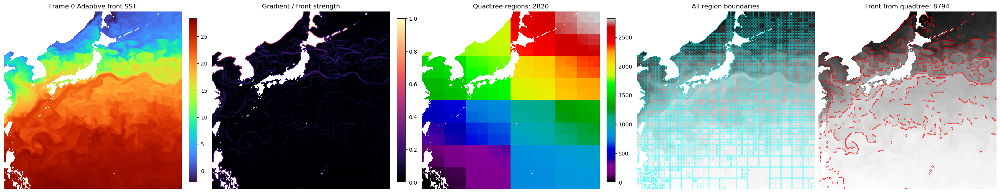

In [120]:
front_qt_adaptive = extract_front_adaptive_in_quadtree_blocks(
    labels=qt_result["labels"],
    grad_img=qt_result["grad"],
    mask_ocean=mask_ocean,
    local_percentile=86,
    global_grad_min=0.045,
    min_component_size=6,
    close_size=2
)

print("自适应四叉树锋面像素数:", int(front_qt_adaptive.sum()))

plot_quadtree_result(
    sst_img=sst_raw,
    mask_ocean=mask_ocean,
    qt_result=qt_result,
    front_mask=front_qt_adaptive,
    boundary_mask=boundary_qt,
    title_prefix="Frame 0 Adaptive front"
)

In [129]:


from scipy.ndimage import gaussian_filter, binary_closing, binary_dilation
from skimage.segmentation import find_boundaries
from skimage.morphology import remove_small_objects
from skimage.measure import label as cc_label, regionprops


# ============================================================
# 1. 计算梯度图：锋面强度
# ============================================================
def compute_gradient_map(sst, mask_ocean, sigma=1.2, p_clip=99):
    """
    根据 SST 计算归一化梯度图。
    梯度越大，越可能是锋面。

    参数:
        sigma: 平滑尺度，越大越能压制碎纹理
        p_clip: 用高分位归一化，避免极端值影响
    """
    s = sst.copy().astype(np.float32)
    s[~mask_ocean] = np.nan

    mean_val = np.nanmean(s)
    s = np.where(np.isnan(s), mean_val, s)

    if sigma > 0:
        s = gaussian_filter(s, sigma=sigma)

    gy, gx = np.gradient(s)
    grad = np.sqrt(gx ** 2 + gy ** 2)
    grad[~mask_ocean] = 0.0

    vals = grad[mask_ocean & np.isfinite(grad)]
    if len(vals) == 0:
        return np.zeros_like(grad, dtype=np.float32)

    gmax = np.percentile(vals, p_clip)

    if gmax > 0:
        grad = np.clip(grad / gmax, 0, 1)
    else:
        grad = np.zeros_like(grad, dtype=np.float32)

    grad[~mask_ocean] = 0.0

    return grad.astype(np.float32)


# ============================================================
# 2. 判断四叉树块是否继续切分
# ============================================================
def should_split_block(
    block,
    grad_block,
    min_size=10,
    var_thr=0.035,
    grad_mean_thr=0.045,
    grad_p90_thr=0.090,
    temp_range_thr=0.75
):
    """
    判断一个块是否继续切。

    满足多个条件，说明这个块内部不够一致，
    或者可能有锋面穿过，就继续切。
    """
    h, w = block.shape

    if h <= min_size or w <= min_size:
        return False

    valid = np.isfinite(block)

    if valid.sum() < max(8, int(0.30 * h * w)):
        return False

    vals = block[valid]
    gvals = grad_block[valid]

    if len(vals) < 8 or len(gvals) < 8:
        return False

    var_val = np.var(vals)
    grad_mean = np.mean(gvals)
    grad_p90 = np.percentile(gvals, 90)
    temp_range = np.percentile(vals, 95) - np.percentile(vals, 5)

    cond1 = var_val > var_thr
    cond2 = grad_mean > grad_mean_thr
    cond3 = grad_p90 > grad_p90_thr
    cond4 = temp_range > temp_range_thr

    score = int(cond1) + int(cond2) + int(cond3) + int(cond4)

    # 满足两项以上才切，避免全图碎裂
    return score >= 2


# ============================================================
# 3. 四叉树自适应分割
# ============================================================
def run_quadtree_segmentation(
    sst,
    mask_ocean,
    grad,
    min_size=10,
    var_thr=0.035,
    grad_mean_thr=0.045,
    grad_p90_thr=0.090,
    temp_range_thr=0.75
):
    """
    四叉树自适应分割。

    平滑区域：保留大块。
    变化剧烈区域：继续切小。
    """
    H, W = sst.shape

    labels = -np.ones((H, W), dtype=np.int32)
    regions = []
    rid = 0

    def recurse(r0, r1, c0, c1):
        nonlocal rid

        block_mask = mask_ocean[r0:r1, c0:c1]

        if block_mask.sum() == 0:
            return

        block = sst[r0:r1, c0:c1].copy().astype(np.float32)
        gblock = grad[r0:r1, c0:c1].copy().astype(np.float32)

        block[~block_mask] = np.nan
        gblock[~block_mask] = np.nan

        h = r1 - r0
        w = c1 - c0

        split_flag = should_split_block(
            block=block,
            grad_block=gblock,
            min_size=min_size,
            var_thr=var_thr,
            grad_mean_thr=grad_mean_thr,
            grad_p90_thr=grad_p90_thr,
            temp_range_thr=temp_range_thr
        )

        if split_flag and h >= 2 * min_size and w >= 2 * min_size:
            rm = (r0 + r1) // 2
            cm = (c0 + c1) // 2

            recurse(r0, rm, c0, cm)
            recurse(r0, rm, cm, c1)
            recurse(rm, r1, c0, cm)
            recurse(rm, r1, cm, c1)

        else:
            labels[r0:r1, c0:c1][block_mask] = rid
            regions.append((rid, r0, r1, c0, c1))
            rid += 1

    recurse(0, H, 0, W)

    labels[~mask_ocean] = -1

    return labels, regions


# ============================================================
# 4. 从四叉树边界中提取主锋面
# ============================================================
def extract_region_boundary_front(
    labels,
    sst,
    grad,
    mask_ocean,
    temp_diff_thr=0.55,
    grad_thr=0.065,
    min_len=12
):
    """
    从四叉树区域边界中筛选主锋面。

    只保留:
        1. 两侧区域温差较大
        2. 边界处梯度较强
    的区域边界。
    """
    boundary = find_boundaries(labels, mode="thick") & mask_ocean
    front = np.zeros_like(boundary, dtype=bool)

    H, W = labels.shape
    dirs = [(-1, 0), (1, 0), (0, -1), (0, 1)]

    region_mean = {}
    valid_ids = np.unique(labels[labels >= 0])

    for rid in valid_ids:
        vals = sst[(labels == rid) & mask_ocean]
        if len(vals) > 0:
            region_mean[int(rid)] = float(np.nanmean(vals))

    ys, xs = np.where(boundary)

    for i, j in zip(ys, xs):
        cur = int(labels[i, j])

        if cur < 0:
            continue

        neighbor_labels = set()

        for di, dj in dirs:
            ni, nj = i + di, j + dj

            if 0 <= ni < H and 0 <= nj < W and mask_ocean[ni, nj]:
                nb = int(labels[ni, nj])

                if nb >= 0 and nb != cur:
                    neighbor_labels.add(nb)

        if len(neighbor_labels) == 0:
            continue

        keep = False

        for nb in neighbor_labels:
            if cur not in region_mean or nb not in region_mean:
                continue

            dtemp = abs(region_mean[cur] - region_mean[nb])

            if dtemp >= temp_diff_thr and grad[i, j] >= grad_thr:
                keep = True
                break

        if keep:
            front[i, j] = True

    front = remove_small_objects(front, min_size=min_len)

    return front, boundary


# ============================================================
# 5. 每个四叉树块内部补提局部细锋面
# ============================================================
def extract_local_front_inside_blocks(
    labels,
    grad,
    mask_ocean,
    local_percentile=92,
    global_grad_min=0.065,
    min_component_size=12
):
    """
    在每个四叉树块内部提取局部锋面候选。

    这一步不是直接把所有高梯度都要，
    而是在每个块内部取高分位梯度。
    """
    front = np.zeros_like(mask_ocean, dtype=bool)

    valid_ids = np.unique(labels[labels >= 0])

    for rid in valid_ids:
        region = (labels == rid) & mask_ocean

        if region.sum() < 15:
            continue

        gvals = grad[region]

        if len(gvals) == 0:
            continue

        local_thr = np.percentile(gvals, local_percentile)
        thr = max(local_thr, global_grad_min)

        part = region & (grad >= thr)
        front |= part

    front = remove_small_objects(front, min_size=min_component_size)

    return front


# ============================================================
# 6. 形状筛选：只保留更像锋面的细长连通体
# ============================================================
def filter_front_by_shape(
    front_mask,
    min_pixels=12,
    min_major_axis=16,
    min_aspect_ratio=2.2
):
    """
    过滤掉团状、小块状、过短的伪锋面。

    真正的锋面通常更细长、更连续。
    """
    lab = cc_label(front_mask, connectivity=2)
    out = np.zeros_like(front_mask, dtype=bool)

    for reg in regionprops(lab):
        if reg.area < min_pixels:
            continue

        major = reg.major_axis_length if reg.major_axis_length > 0 else 0.0
        minor = reg.minor_axis_length if reg.minor_axis_length > 1e-6 else 1e-6

        aspect = major / minor

        if major >= min_major_axis and aspect >= min_aspect_ratio:
            out[lab == reg.label] = True

    return out


# ============================================================
# 7. 融合主锋面与局部锋面
# ============================================================
def combine_fronts(
    front_boundary,
    front_local,
    dilate_iter=0,
    close_size=1,
    min_size=12
):
    """
    融合主锋面和局部锋面。

    默认不膨胀，因为膨胀会让碎线变粗、变乱。
    """
    front = front_boundary | front_local

    if dilate_iter > 0:
        for _ in range(dilate_iter):
            front = binary_dilation(front)

    if close_size > 1:
        front = binary_closing(front, structure=np.ones((close_size, close_size)))

    front = remove_small_objects(front, min_size=min_size)

    return front


# ============================================================
# 8. 总流程函数
# ============================================================
def run_quadtree_front_pipeline_optimized(
    sst,
    mask_ocean,

    # 梯度
    grad_sigma=1.25,
    grad_clip_percentile=99,

    # 四叉树分割
    min_size=10,
    var_thr=0.035,
    grad_mean_thr=0.045,
    grad_p90_thr=0.090,
    temp_range_thr=0.75,

    # 区域边界主锋面
    temp_diff_thr=0.55,
    boundary_grad_thr=0.065,

    # 块内局部细锋面
    local_percentile=92,
    global_grad_min=0.065,

    # 形状筛选
    shape_min_pixels=12,
    shape_min_major_axis=16,
    shape_min_aspect_ratio=2.2,

    # 后处理
    min_component_size=12,
    dilate_iter=0,
    close_size=1
):
    """
    优化后的完整流程。

    逻辑:
        1. 计算梯度图
        2. 四叉树自适应分块
        3. 从四叉树边界提主锋面
        4. 从块内部补提局部锋面
        5. 对局部锋面做细长形状筛选
        6. 融合得到最终锋面
    """
    grad = compute_gradient_map(
        sst=sst,
        mask_ocean=mask_ocean,
        sigma=grad_sigma,
        p_clip=grad_clip_percentile
    )

    labels, regions = run_quadtree_segmentation(
        sst=sst,
        mask_ocean=mask_ocean,
        grad=grad,
        min_size=min_size,
        var_thr=var_thr,
        grad_mean_thr=grad_mean_thr,
        grad_p90_thr=grad_p90_thr,
        temp_range_thr=temp_range_thr
    )

    front_boundary, boundary_all = extract_region_boundary_front(
        labels=labels,
        sst=sst,
        grad=grad,
        mask_ocean=mask_ocean,
        temp_diff_thr=temp_diff_thr,
        grad_thr=boundary_grad_thr,
        min_len=min_component_size
    )

    front_local_raw = extract_local_front_inside_blocks(
        labels=labels,
        grad=grad,
        mask_ocean=mask_ocean,
        local_percentile=local_percentile,
        global_grad_min=global_grad_min,
        min_component_size=min_component_size
    )

    front_local = filter_front_by_shape(
        front_mask=front_local_raw,
        min_pixels=shape_min_pixels,
        min_major_axis=shape_min_major_axis,
        min_aspect_ratio=shape_min_aspect_ratio
    )

    front_final = combine_fronts(
        front_boundary=front_boundary,
        front_local=front_local,
        dilate_iter=dilate_iter,
        close_size=close_size,
        min_size=min_component_size
    )

    result = {
        "grad": grad,
        "labels": labels,
        "regions": regions,
        "boundary_all": boundary_all,
        "front_boundary": front_boundary,
        "front_local_raw": front_local_raw,
        "front_local": front_local,
        "front_final": front_final
    }

    return result


# ============================================================
# 9. 打印统计信息
# ============================================================
def print_quadtree_front_stats(result, mask_ocean):
    labels = result["labels"]

    print("四叉树区域数量:", len(result["regions"]))
    print("全部区域边界像素数:", int(result["boundary_all"].sum()))
    print("区域边界主锋面像素数:", int(result["front_boundary"].sum()))
    print("块内局部锋面原始像素数:", int(result["front_local_raw"].sum()))
    print("块内局部锋面形状筛选后像素数:", int(result["front_local"].sum()))
    print("最终锋面像素数:", int(result["front_final"].sum()))
    print("海域内未分配像素数:", int(np.sum((labels < 0) & mask_ocean)))


# ============================================================
# 10. 可视化
# ============================================================
def show_quadtree_front_result_optimized(
    sst,
    mask_ocean,
    result,
    title_prefix="Frame 0"
):
    grad = result["grad"]
    labels = result["labels"]

    boundary_all = result["boundary_all"]
    front_boundary = result["front_boundary"]
    front_local_raw = result["front_local_raw"]
    front_local = result["front_local"]
    front_final = result["front_final"]

    sst_show = np.where(mask_ocean, sst, np.nan)
    grad_show = np.where(mask_ocean, grad, np.nan)

    lab_show = labels.copy().astype(float)
    lab_show[labels < 0] = np.nan

    fig, axes = plt.subplots(2, 4, figsize=(24, 11), constrained_layout=True)

    im0 = axes[0, 0].imshow(sst_show, cmap="turbo", origin="lower")
    axes[0, 0].set_title(f"{title_prefix} SST")
    axes[0, 0].axis("off")
    plt.colorbar(im0, ax=axes[0, 0], fraction=0.046)

    im1 = axes[0, 1].imshow(grad_show, cmap="magma", origin="lower", vmin=0, vmax=1)
    axes[0, 1].set_title("Gradient / front strength")
    axes[0, 1].axis("off")
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)

    im2 = axes[0, 2].imshow(lab_show, cmap="tab20", origin="lower")
    axes[0, 2].set_title(f"Quadtree regions: {len(result['regions'])}")
    axes[0, 2].axis("off")
    plt.colorbar(im2, ax=axes[0, 2], fraction=0.046)

    axes[0, 3].imshow(sst_show, cmap="gray", origin="lower")
    yy, xx = np.where(boundary_all)
    axes[0, 3].scatter(xx, yy, s=0.15, c="cyan")
    axes[0, 3].set_title("All quadtree boundaries")
    axes[0, 3].axis("off")

    axes[1, 0].imshow(sst_show, cmap="gray", origin="lower")
    yy, xx = np.where(front_boundary)
    axes[1, 0].scatter(xx, yy, s=0.35, c="red")
    axes[1, 0].set_title(f"Boundary fronts: {int(front_boundary.sum())}")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(sst_show, cmap="gray", origin="lower")
    yy, xx = np.where(front_local_raw)
    axes[1, 1].scatter(xx, yy, s=0.25, c="orange")
    axes[1, 1].set_title(f"Local raw fronts: {int(front_local_raw.sum())}")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(sst_show, cmap="gray", origin="lower")
    yy, xx = np.where(front_local)
    axes[1, 2].scatter(xx, yy, s=0.35, c="yellow")
    axes[1, 2].set_title(f"Local shape-filtered: {int(front_local.sum())}")
    axes[1, 2].axis("off")

    axes[1, 3].imshow(sst_show, cmap="gray", origin="lower")
    yy, xx = np.where(front_final)
    axes[1, 3].scatter(xx, yy, s=0.35, c="red")
    axes[1, 3].set_title(f"Final fronts: {int(front_final.sum())}")
    axes[1, 3].axis("off")

    plt.show()

四叉树区域数量: 770
全部区域边界像素数: 44204
区域边界主锋面像素数: 8039
块内局部锋面像素数: 4777
最终锋面像素数: 11973
海域内未分配像素数: 0


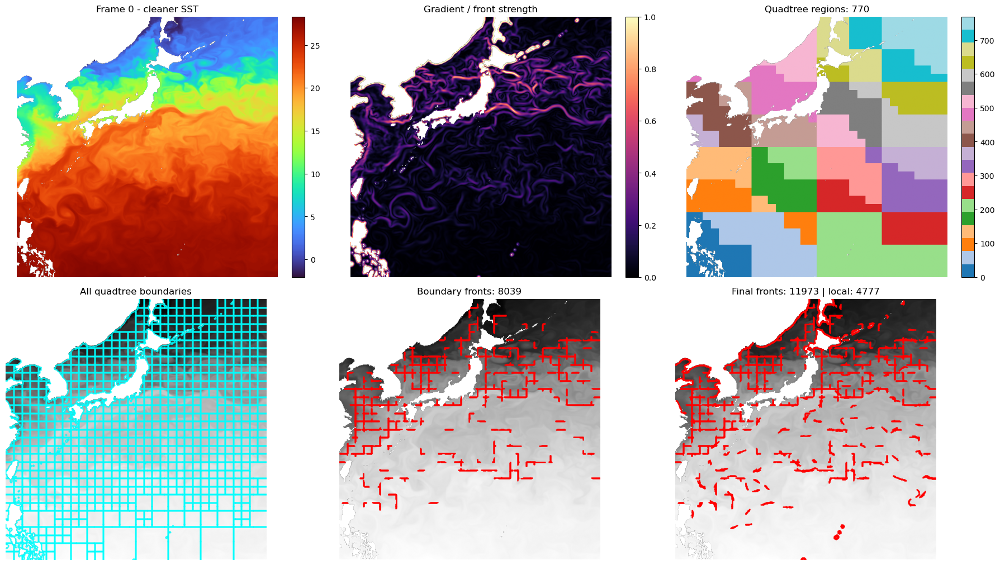

In [ ]:
qt_result_opt = run_quadtree_front_pipeline_optimized(
    sst=sst_raw,
    mask_ocean=mask_ocean,

    # 梯度平滑，稍微压制碎纹理
    grad_sigma=1.25,
    grad_clip_percentile=99,

    # 四叉树分割，不让它切得太碎
    min_size=10,
    var_thr=0.035,
    grad_mean_thr=0.045,
    grad_p90_thr=0.090,
    temp_range_thr=0.75,

    # 区域边界主锋面筛选
    temp_diff_thr=0.55,
    boundary_grad_thr=0.065,

    # 块内局部锋面，比较保守，避免左上角爆炸
    local_percentile=92,
    global_grad_min=0.065,

    # 形状筛选：只保留更细长、更连续的结构
    shape_min_pixels=12,
    shape_min_major_axis=16,
    shape_min_aspect_ratio=2.2,

    # 后处理：默认不膨胀
    min_component_size=12,
    dilate_iter=0,
    close_size=1
)

print_quadtree_front_stats(qt_result_opt, mask_ocean)

show_quadtree_front_result_optimized(
    sst=sst_raw,
    mask_ocean=mask_ocean,
    result=qt_result_opt,
    title_prefix="Frame 0 - optimized balanced"
)

In [121]:

import torch.nn.functional as F
from sklearn.metrics import mean_squared_error, r2_score

def train_model(model, train_feat, train_y, test_feat, test_y, edge_index,
                epochs=15, batch_size=8, lr=1e-3, patience=5):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("进入 train_model，开始训练", flush=True)
    print("device =", device, flush=True)

    model = model.to(device)
    edge_index = edge_index.long().contiguous().to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

    best_rmse = float("inf")
    wait = 0

    history = {
        "train_loss": [],
        "val_rmse": [],
        "val_r2": []
    }

    train_feat = train_feat.to(device)
    train_y = train_y.to(device)

    print("train_feat shape =", train_feat.shape, flush=True)
    print("train_y shape    =", train_y.shape, flush=True)
    print("test_feat shape  =", test_feat.shape, flush=True)
    print("test_y shape     =", test_y.shape, flush=True)

    for epoch in range(epochs):
        model.train()
        total_loss = 0.0

        perm = torch.randperm(len(train_feat), device=train_feat.device)
        train_feat_epoch = train_feat[perm]
        train_y_epoch = train_y[perm]

        num_batches = (len(train_feat_epoch) + batch_size - 1) // batch_size

        for bi, i in enumerate(range(0, len(train_feat_epoch), batch_size), start=1):
            bx = train_feat_epoch[i:i + batch_size]
            by = train_y_epoch[i:i + batch_size]

            optimizer.zero_grad()
            pred = model(bx, edge_index)
            loss = F.mse_loss(pred, by)
            loss.backward()
            optimizer.step()

            total_loss += loss.item() * bx.size(0)

            if bi % 50 == 0 or bi == num_batches:
                print(
                    f"Epoch {epoch+1:03d}/{epochs} | "
                    f"Batch {bi:04d}/{num_batches} | "
                    f"BatchLoss: {loss.item():.6f}",
                    flush=True
                )

        avg_train_loss = total_loss / len(train_feat)

        model.eval()
        val_preds = []
        with torch.no_grad():
            for j in range(0, len(test_feat), batch_size):
                vb = test_feat[j:j + batch_size].to(device)
                vp = model(vb, edge_index)
                val_preds.append(vp.cpu())

        val_pred = torch.cat(val_preds, dim=0)
        y_true = test_y.cpu().numpy().flatten()
        y_pred = val_pred.numpy().flatten()

        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)

        history["train_loss"].append(avg_train_loss)
        history["val_rmse"].append(rmse)
        history["val_r2"].append(r2)

        print(
            f"Epoch {epoch+1:03d}/{epochs} DONE | "
            f"TrainLoss: {avg_train_loss:.6f} | "
            f"ValRMSE: {rmse:.6f} | "
            f"ValR2: {r2:.6f}",
            flush=True
        )

        if rmse < best_rmse:
            best_rmse = rmse
            wait = 0
            torch.save(model.state_dict(), "best_sst_model.pth")
            print("保存当前最优模型", flush=True)
        else:
            wait += 1
            print(f"EarlyStop wait = {wait}/{patience}", flush=True)

        if wait >= patience:
            print(f"Early stopping at epoch {epoch+1}", flush=True)
            break

    model.load_state_dict(torch.load("best_sst_model.pth", map_location=device))
    print("训练完成，已加载最优模型", flush=True)

    return model, history

In [123]:
qt_result = run_quadtree_front_pipeline(
    sst=sst_raw,
    mask_ocean=mask_ocean,
    grad_sigma=1.0,
    min_size=8,
    var_thr=0.025,
    grad_mean_thr=0.035,
    grad_p90_thr=0.075,
    temp_range_thr=0.6,
    temp_diff_thr=0.45,
    boundary_grad_thr=0.05,
    local_percentile=86,
    global_grad_min=0.04,
    min_component_size=6,
    dilate_iter=1,
    close_size=2
)

show_quadtree_front_result(sst_raw, mask_ocean, qt_result, title_prefix="Frame 0")

NameError: name 'run_quadtree_front_pipeline' is not defined

In [70]:
model = SuperpixelGCNTransformer()

model, history = train_model(
    model=model,
    train_feat=train_feat,
    train_y=train_y,      
    test_feat=test_feat,
    test_y=test_y,        
    edge_index=edge_index,
    epochs=15,
    batch_size=8,
    lr=1e-3,
    patience=5
)

进入 train_model，开始训练
device = cuda


train_feat shape = torch.Size([9632, 5, 2491, 3])
train_y shape    = torch.Size([9632, 2491])
test_feat shape  = torch.Size([2408, 5, 2491, 3])
test_y shape     = torch.Size([2408, 2491])
Epoch 001/15 | Batch 0050/1204 | BatchLoss: 0.000975
Epoch 001/15 | Batch 0100/1204 | BatchLoss: 0.000086
Epoch 001/15 | Batch 0150/1204 | BatchLoss: 0.000059
Epoch 001/15 | Batch 0200/1204 | BatchLoss: 0.000049
Epoch 001/15 | Batch 0250/1204 | BatchLoss: 0.000045
Epoch 001/15 | Batch 0300/1204 | BatchLoss: 0.000051
Epoch 001/15 | Batch 0350/1204 | BatchLoss: 0.000038
Epoch 001/15 | Batch 0400/1204 | BatchLoss: 0.000037
Epoch 001/15 | Batch 0450/1204 | BatchLoss: 0.000038
Epoch 001/15 | Batch 0500/1204 | BatchLoss: 0.000042
Epoch 001/15 | Batch 0550/1204 | BatchLoss: 0.000033
Epoch 001/15 | Batch 0600/1204 | BatchLoss: 0.000036
Epoch 001/15 | Batch 0650/1204 | BatchLoss: 0.000054
Epoch 001/15 | Batch 0700/1204 | BatchLoss: 0.000032
Epoch 001/15 | Batch 0750/1204 | BatchLoss: 0.000043
Epoch 001/15 | Ba

In [71]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
edge_index = edge_index.long().contiguous().to(device)

model.eval()
pred_list = []
batch_size = 8

with torch.no_grad():
    for i in range(0, len(test_feat), batch_size):
        bx = test_feat[i:i + batch_size].to(device)
        pred = model(bx, edge_index)
        pred_list.append(pred.cpu())

pred_test = torch.cat(pred_list, dim=0).numpy()

last_input_test = test_feat[:, -1, :, 0].cpu().numpy()
pred_test_abs = pred_test + last_input_test
test_y_abs_np = test_y_abs.cpu().numpy()

print("pred_test shape:", pred_test.shape)
print("pred_test_abs shape:", pred_test_abs.shape)
print("test_y_abs_np shape:", test_y_abs_np.shape)

pred_test shape: (2408, 2491)
pred_test_abs shape: (2408, 2491)
test_y_abs_np shape: (2408, 2491)


In [72]:
from matplotlib.colors import ListedColormap

def plot_prediction_comparison(
    y_true_node, y_pred_node, segments, mask_ocean,
    vmin_raw, vmax_raw, save_path=None, title_prefix="SST Prediction"
):
    true_img = node_to_pixel(y_true_node, segments, mask_ocean)
    pred_img = node_to_pixel(y_pred_node, segments, mask_ocean)

    true_img = inverse_scale(true_img, vmin_raw, vmax_raw)
    pred_img = inverse_scale(pred_img, vmin_raw, vmax_raw)
    err_img = pred_img - true_img

    true_ma = np.ma.masked_where(~mask_ocean, true_img)
    pred_ma = np.ma.masked_where(~mask_ocean, pred_img)
    err_ma = np.ma.masked_where(~mask_ocean, err_img)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

    cmap_main = plt.cm.turbo.copy()
    cmap_main.set_bad(color="#BFBFBF")

    cmap_err = plt.cm.RdBu_r.copy()
    cmap_err.set_bad(color="#BFBFBF")

    im0 = axes[0].imshow(
        true_ma, cmap=cmap_main, vmin=vmin_raw, vmax=vmax_raw, origin="lower"
    )
    axes[0].set_title(f"{title_prefix} - Ground Truth", fontsize=14, fontweight="bold")
    axes[0].axis("off")
    cbar0 = plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
    cbar0.set_label("SST")

    im1 = axes[1].imshow(
        pred_ma, cmap=cmap_main, vmin=vmin_raw, vmax=vmax_raw, origin="lower"
    )
    axes[1].set_title(f"{title_prefix} - Prediction", fontsize=14, fontweight="bold")
    axes[1].axis("off")
    cbar1 = plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
    cbar1.set_label("SST")

    err_lim = np.nanmax(np.abs(err_img[mask_ocean]))
    if np.isnan(err_lim) or err_lim == 0:
        err_lim = 1e-6

    im2 = axes[2].imshow(
        err_ma, cmap=cmap_err, vmin=-err_lim, vmax=err_lim, origin="lower"
    )
    axes[2].set_title(f"{title_prefix} - Error", fontsize=14, fontweight="bold")
    axes[2].axis("off")
    cbar2 = plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
    cbar2.set_label("Pred - True")

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()

In [73]:
def inverse_scale(x, vmin, vmax):
    return x * (vmax - vmin + 1e-8) + vmin

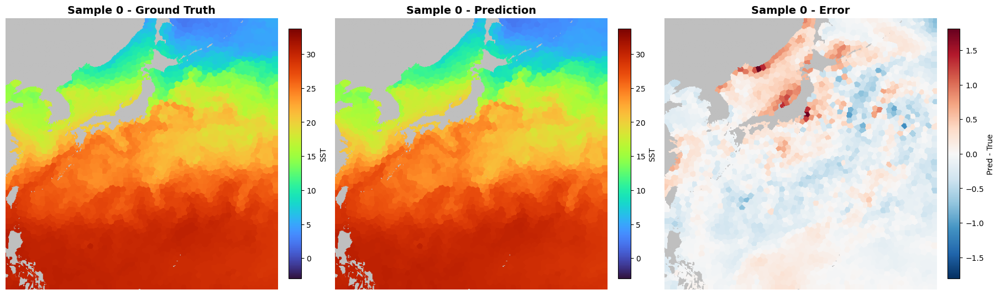

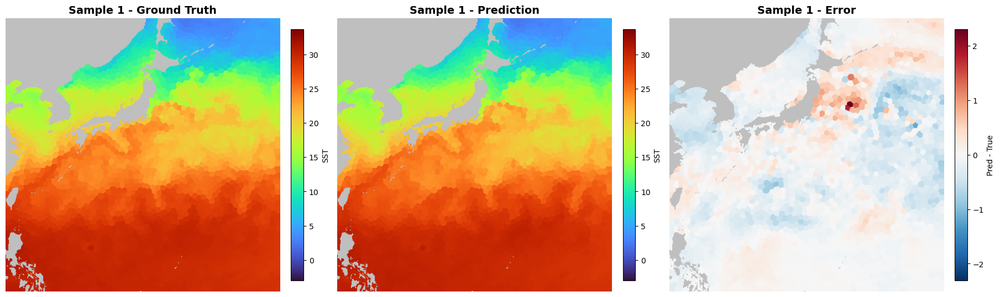

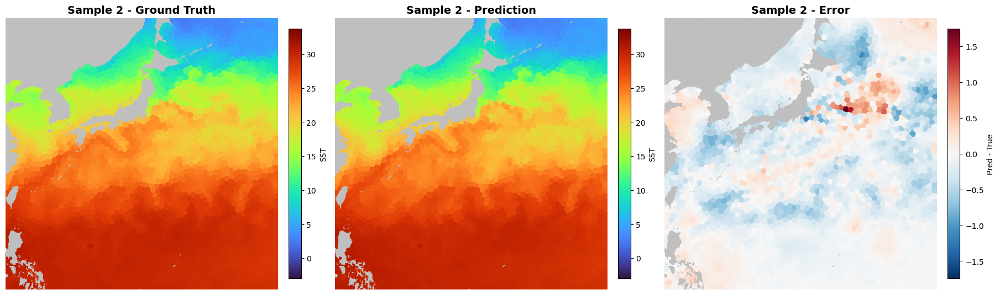

In [74]:
for idx in [0, 1, 2]:
    y_true_node = test_y_abs_np[idx]
    y_pred_node = pred_test_abs[idx]

    plot_prediction_comparison(
        y_true_node,
        y_pred_node,
        segments,
        mask_ocean,
        vmin_raw=data_min,
        vmax_raw=data_max,
        title_prefix=f"Sample {idx}"
    )

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import sobel, binary_dilation
from skimage.segmentation import find_boundaries

def inverse_scale(x, vmin, vmax):
    return x * (vmax - vmin + 1e-8) + vmin

def get_front_from_sst(sst_img, mask_ocean, q=95):

    img = sst_img.copy().astype(np.float32)
    img[~mask_ocean] = np.nan

    fill_value = np.nanmean(img[mask_ocean])
    img_fill = np.where(np.isnan(img), fill_value, img)

    gx = sobel(img_fill, axis=1)
    gy = sobel(img_fill, axis=0)
    grad = np.sqrt(gx**2 + gy**2)
    grad[~mask_ocean] = np.nan

    thr = np.nanpercentile(grad[mask_ocean], q)
    front_mask = (grad >= thr) & mask_ocean

    return grad, front_mask, thr

def plot_front_vs_superpixels(sst_img, grad, front_mask, segments, mask_ocean, title_prefix=""):
    seg_bound = find_boundaries(segments, mode="outer")
    seg_bound = seg_bound & mask_ocean

    sst_ma = np.ma.masked_where(~mask_ocean, sst_img)
    grad_ma = np.ma.masked_where(~mask_ocean, grad)
    front_ma = np.ma.masked_where(~mask_ocean, front_mask.astype(float))

    fig, axes = plt.subplots(1, 4, figsize=(22, 5), constrained_layout=True)

    im0 = axes[0].imshow(sst_ma, cmap="turbo", origin="lower")
    axes[0].set_title(f"{title_prefix} SST")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(grad_ma, cmap="jet", origin="lower")
    axes[1].set_title(f"{title_prefix} Gradient")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    im2 = axes[2].imshow(front_ma, cmap="gray", origin="lower", vmin=0, vmax=1)
    axes[2].set_title(f"{title_prefix} Front Mask")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    axes[3].imshow(sst_ma, cmap="gray", origin="lower")
    axes[3].contour(front_mask.astype(int), levels=[0.5], colors="red", linewidths=1.0)
    axes[3].contour(seg_bound.astype(int), levels=[0.5], colors="cyan", linewidths=0.4)
    axes[3].set_title(f"{title_prefix} Front(red) vs Superpixel(cyan)")
    axes[3].axis("off")

    plt.show()

def calc_front_boundary_overlap(front_mask, segments, mask_ocean, dilate_iter=1):
    seg_bound = find_boundaries(segments, mode="outer") & mask_ocean

    if dilate_iter > 0:
        seg_bound_d = binary_dilation(seg_bound, iterations=dilate_iter) & mask_ocean
        front_d = binary_dilation(front_mask, iterations=dilate_iter) & mask_ocean
    else:
        seg_bound_d = seg_bound
        front_d = front_mask

    front_hit_ratio = (front_mask & seg_bound_d).sum() / (front_mask.sum() + 1e-8)
    bound_hit_ratio = (seg_bound & front_d).sum() / (seg_bound.sum() + 1e-8)

    print(f"Front pixels near superpixel boundaries: {front_hit_ratio:.4f}")
    print(f"Boundary pixels near front regions:      {bound_hit_ratio:.4f}")

    return front_hit_ratio, bound_hit_ratio

gradient threshold = 6.3678236


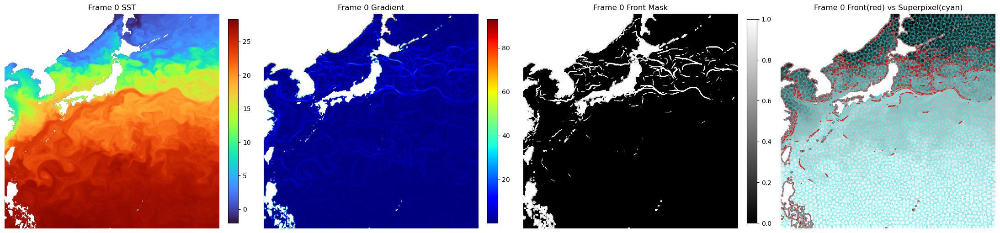

Front pixels near superpixel boundaries: 0.7860
Boundary pixels near front regions:      0.1131


(np.float64(0.7860413063375866), np.float64(0.11310086195617351))

In [76]:
idx = 0  

sst_norm = sst_scaled[idx]
sst_raw = inverse_scale(sst_norm, data_min, data_max)

grad, front_mask, thr = get_front_from_sst(sst_raw, mask_ocean, q=95)
print("gradient threshold =", thr)

plot_front_vs_superpixels(
    sst_raw,
    grad,
    front_mask,
    segments,
    mask_ocean,
    title_prefix=f"Frame {idx}"
)

calc_front_boundary_overlap(front_mask, segments, mask_ocean, dilate_iter=1)


Frame 0, threshold = 6.3678


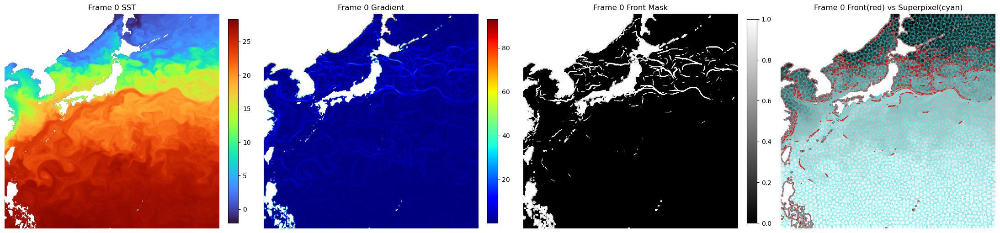

Front pixels near superpixel boundaries: 0.7860
Boundary pixels near front regions:      0.1131

Frame 300, threshold = 4.7574


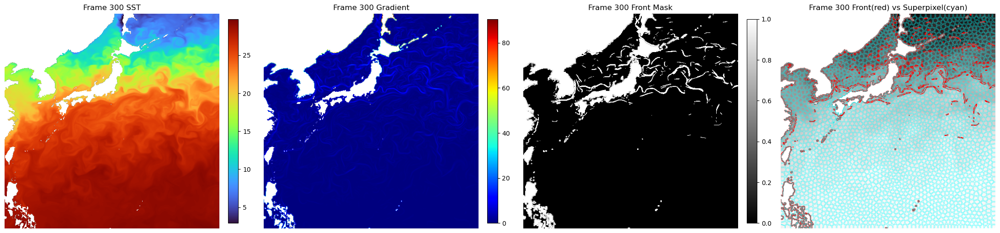

Front pixels near superpixel boundaries: 0.7731
Boundary pixels near front regions:      0.1095

Frame 900, threshold = 4.1321


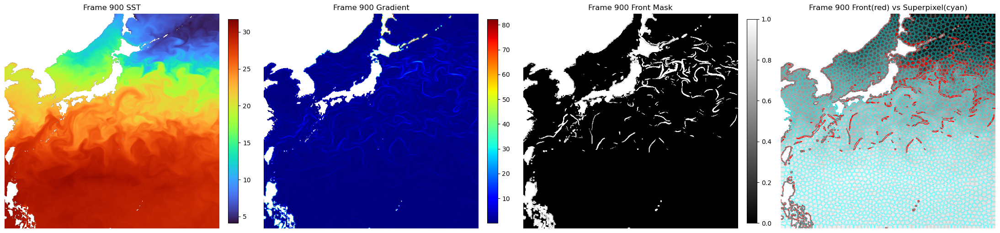

Front pixels near superpixel boundaries: 0.7726
Boundary pixels near front regions:      0.1117


In [77]:
for idx in [0, 300, 900]:
    sst_raw = inverse_scale(sst_scaled[idx], data_min, data_max)
    grad, front_mask, thr = get_front_from_sst(sst_raw, mask_ocean, q=95)
    print(f"\nFrame {idx}, threshold = {thr:.4f}")
    plot_front_vs_superpixels(
        sst_raw, grad, front_mask, segments, mask_ocean, title_prefix=f"Frame {idx}"
    )
    calc_front_boundary_overlap(front_mask, segments, mask_ocean, dilate_iter=1)